## Prerequisites


In [31]:
import dotenv

dotenv.load_dotenv()

True

In [32]:
project_name = "singer_age_decade_80"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "singer_age_decade"
target_positive_class = 80


## 1. Train Multiple CAVs for Significance Test


In [33]:
# training meta parameters
num_train_runs = 100
training_sample_count = 5


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [34]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [35]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [37]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

In [39]:
df_test.target.value_counts()

target
1    152
0    152
Name: count, dtype: int64

In [40]:
df_test.genre.value_counts()

genre
pop             200
jazz             70
french_music     34
Name: count, dtype: int64

In [36]:
df

,song_id,genre,language,release_date,artist_id,gender,birth_year,country_source_1,country_source_2,singer_age,singer_age_decade,target,embedding
0,823112342,pop,fr,2000-11-20,2189.0,female,1915.0,FR,FR,85.0,80.0,1,"[-0.08827146887779236, -0.1256018429994583, -0..."
1,73062878,pop,it,2013-01-01,444.0,female,1933.0,FR,FR,80.0,80.0,1,"[-0.10284428298473358, -0.04569187015295029, 0..."
2,720386852,pop,fr,1995-01-01,2189.0,female,1915.0,FR,FR,80.0,80.0,1,"[-0.15287145972251892, -0.06838546693325043, -..."
3,467510242,pop,fr,2015-06-15,3747.0,female,1934.0,FR,FR,81.0,80.0,1,"[-0.09503902494907379, 0.003959371708333492, -..."
4,3156611,pop,fr,2000-01-01,2189.0,female,1915.0,FR,FR,85.0,80.0,1,"[-0.16109444200992584, 0.018726728856563568, 0..."
5,64037171,pop,fr,2001-01-01,2189.0,female,1915.0,FR,FR,86.0,80.0,1,"[-0.19285807013511658, -0.06591261178255081, -..."
6,857185342,pop,fr,2019-12-13,1603.0,female,1939.0,FR,FR,80.0,80.0,1,"[-0.1736968457698822, -0.056309785693883896, 0..."
7,73104859,pop,fr,2000-11-20,2189.0,female,1915.0,FR,FR,85.0,80.0,1,"[-0.16893364489078522, -0.018462132662534714, ..."
8,1063038,pop,es,1996-01-29,104.0,male,1966.0,NaN,NaN,30.0,30.0,0,"[-0.04529651626944542, -0.192108154296875, 0.1..."
9,1213628252,pop,es,2019-06-14,2133.0,female,1986.0,MX,MX,33.0,30.0,0,"[-0.05557055398821831, -0.14029376208782196, 0..."


### Training


Training run 1/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6884
Epoch 1 Validation Loss: 0.7033
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4727
Epoch 11 Validation Loss: 0.6551
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3225
Epoch 21 Validation Loss: 0.6199
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2249
Epoch 31 Validation Loss: 0.5940
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1633
Epoch 41 Validation Loss: 0.5763
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1241
Epoch 51 Validation Loss: 0.5636
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0982
Epoch 61 Validation Loss: 0.5548
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0

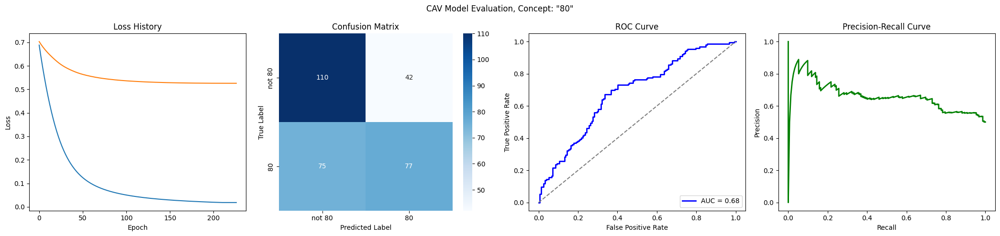

Training run 2/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6996
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4854
Epoch 11 Validation Loss: 0.6750
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3360
Epoch 21 Validation Loss: 0.6509
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2373
Epoch 31 Validation Loss: 0.6303
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1738
Epoch 41 Validation Loss: 0.6138
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1327
Epoch 51 Validation Loss: 0.6011
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1053
Epoch 61 Validation Loss: 0.5911
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0

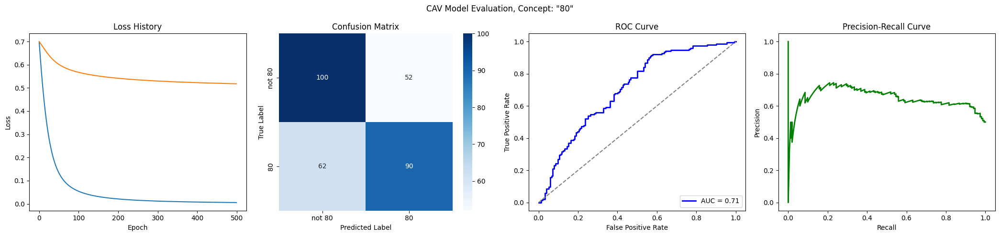

Training run 3/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6849
Epoch 1 Validation Loss: 0.6813
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4958
Epoch 11 Validation Loss: 0.6359
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3561
Epoch 21 Validation Loss: 0.6010
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2592
Epoch 31 Validation Loss: 0.5756
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1941
Epoch 41 Validation Loss: 0.5580
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1504
Epoch 51 Validation Loss: 0.5463
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1204
Epoch 61 Validation Loss: 0.5385
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0

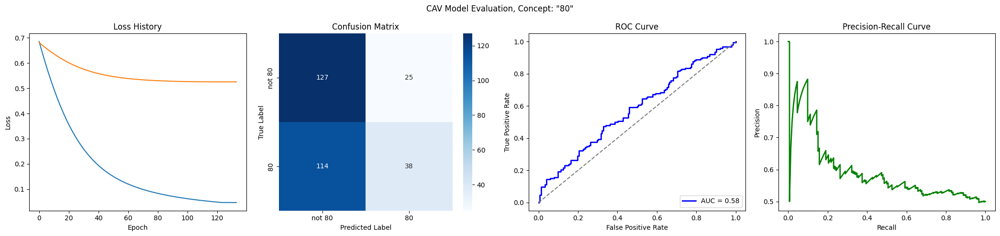

Training run 4/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7005
Epoch 1 Validation Loss: 0.6776
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4764
Epoch 11 Validation Loss: 0.6378
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3236
Epoch 21 Validation Loss: 0.6019
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2252
Epoch 31 Validation Loss: 0.5736
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1632
Epoch 41 Validation Loss: 0.5501
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1238
Epoch 51 Validation Loss: 0.5321
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0979
Epoch 61 Validation Loss: 0.5174
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0

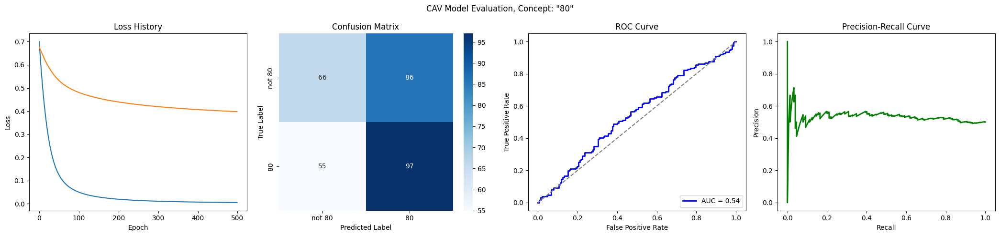

Training run 5/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.7047
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4769
Epoch 11 Validation Loss: 0.6824
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3254
Epoch 21 Validation Loss: 0.6644
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2269
Epoch 31 Validation Loss: 0.6497
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1647
Epoch 41 Validation Loss: 0.6389
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1250
Epoch 51 Validation Loss: 0.6309
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0989
Epoch 61 Validation Loss: 0.6252
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0

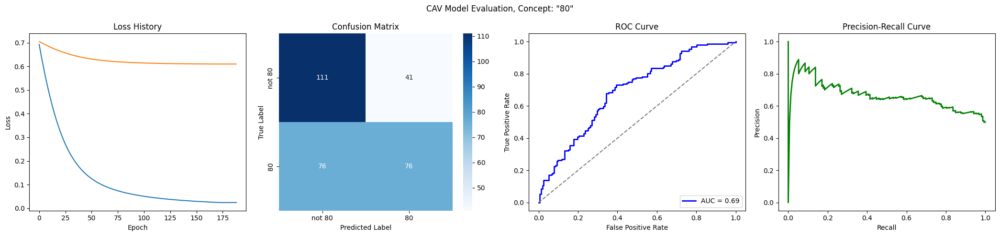

Training run 6/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7214
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4616
Epoch 11 Validation Loss: 0.6905
Early stopping at epoch 15
Loss history saved to trainings/singer_age_decade_80/loss_history.json


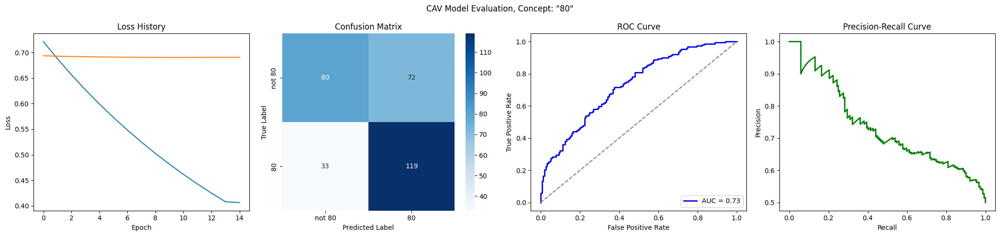

Training run 7/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7013
Epoch 1 Validation Loss: 0.6768
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4841
Epoch 11 Validation Loss: 0.6687
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3331
Epoch 21 Validation Loss: 0.6659
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2341
Epoch 31 Validation Loss: 0.6652
Early stopping at epoch 33
Loss history saved to trainings/singer_age_decade_80/loss_history.json


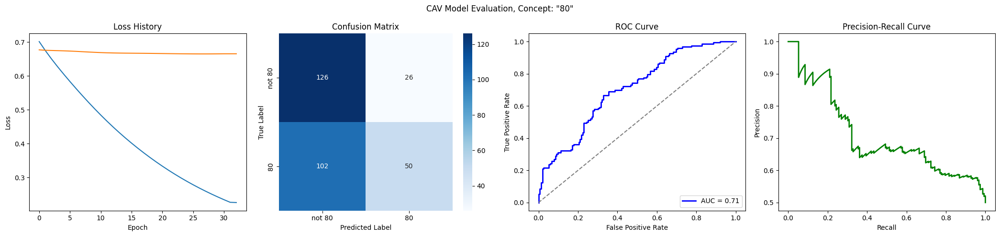

Training run 8/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7227
Epoch 1 Validation Loss: 0.6966
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4640
Epoch 11 Validation Loss: 0.6685
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3062
Epoch 21 Validation Loss: 0.6588
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2098
Epoch 31 Validation Loss: 0.6489
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1507
Epoch 41 Validation Loss: 0.6462
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1361
Epoch 51 Validation Loss: 0.6462
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1359
Epoch 61 Validation Loss: 0.6462
Early stopping at epoch 68
Loss history saved to trainings/singer_age_decade_80/loss_history.jso

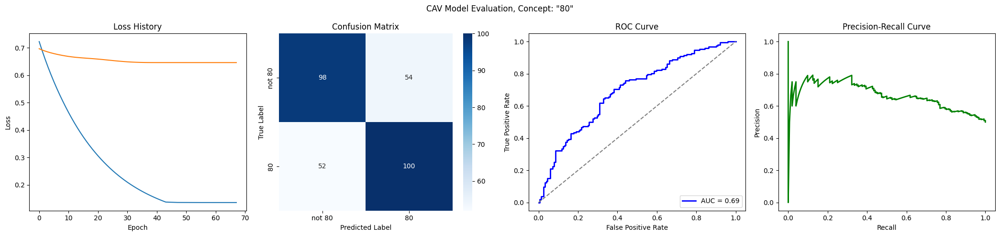

Training run 9/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6812
Epoch 1 Validation Loss: 0.6785
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4869
Epoch 11 Validation Loss: 0.6150
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3462
Epoch 21 Validation Loss: 0.5622
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2496
Epoch 31 Validation Loss: 0.5186
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1856
Epoch 41 Validation Loss: 0.4842
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1432
Epoch 51 Validation Loss: 0.4570
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1143
Epoch 61 Validation Loss: 0.4355
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0

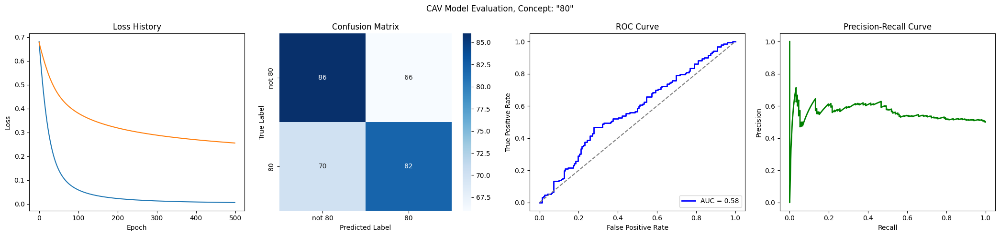

Training run 10/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6852
Epoch 1 Validation Loss: 0.6881
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4868
Epoch 11 Validation Loss: 0.6868
Early stopping at epoch 12
Loss history saved to trainings/singer_age_decade_80/loss_history.json


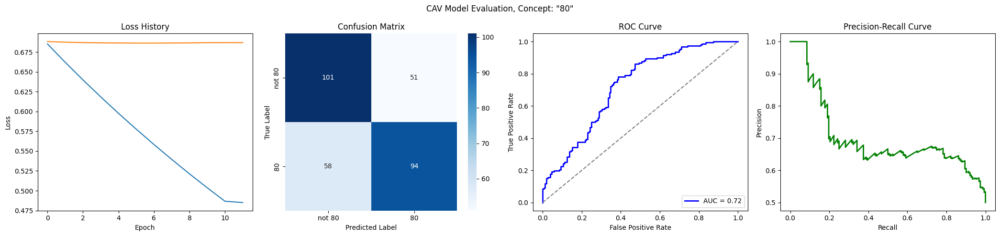

Training run 11/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7044
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5018
Epoch 11 Validation Loss: 0.6659
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3540
Epoch 21 Validation Loss: 0.6427
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2536
Epoch 31 Validation Loss: 0.6236
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1875
Epoch 41 Validation Loss: 0.6086
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1441
Epoch 51 Validation Loss: 0.5964
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1147
Epoch 61 Validation Loss: 0.5867
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

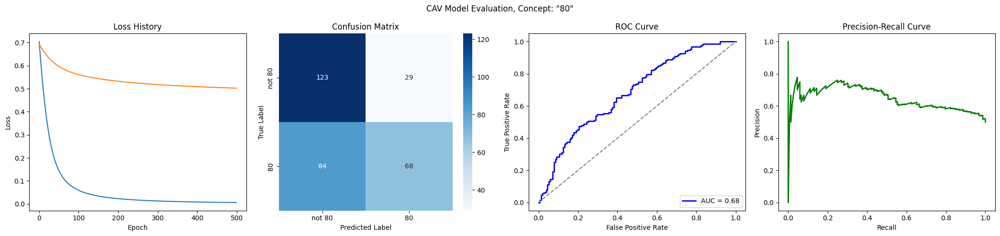

Training run 12/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6926
Epoch 1 Validation Loss: 0.6865
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4667
Epoch 11 Validation Loss: 0.6720
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3136
Epoch 21 Validation Loss: 0.6690
Early stopping at epoch 25
Loss history saved to trainings/singer_age_decade_80/loss_history.json


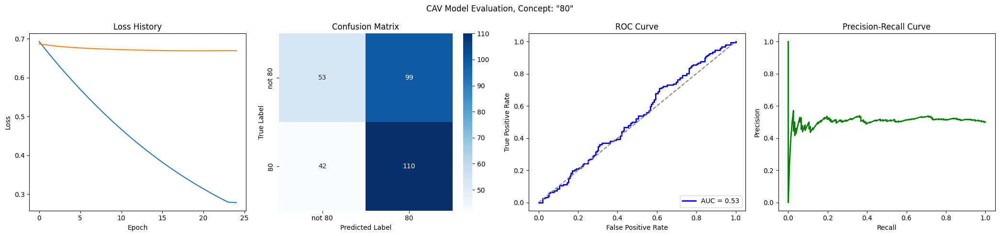

Training run 13/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6890
Epoch 1 Validation Loss: 0.7041
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4798
Epoch 11 Validation Loss: 0.6839
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3326
Epoch 21 Validation Loss: 0.6690
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2351
Epoch 31 Validation Loss: 0.6579
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1723
Epoch 41 Validation Loss: 0.6505
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1317
Epoch 51 Validation Loss: 0.6466
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1045
Epoch 61 Validation Loss: 0.6447
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

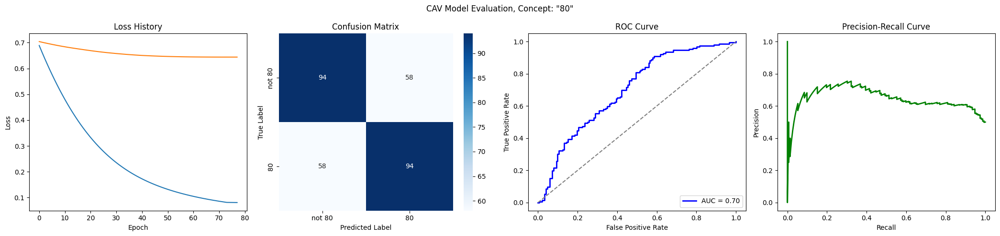

Training run 14/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7066
Epoch 1 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5166
Epoch 11 Validation Loss: 0.6667
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3755
Epoch 21 Validation Loss: 0.6609
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 30
Loss history saved to trainings/singer_age_decade_80/loss_history.json


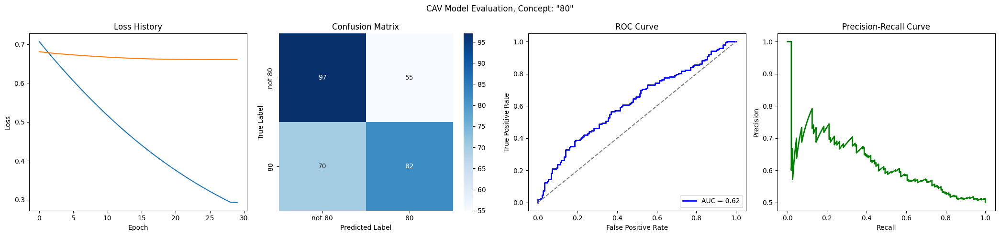

Training run 15/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6894
Epoch 1 Validation Loss: 0.7078
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4931
Epoch 11 Validation Loss: 0.6738
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3550
Epoch 21 Validation Loss: 0.6490
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2608
Epoch 31 Validation Loss: 0.6343
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1974
Epoch 41 Validation Loss: 0.6265
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1541
Epoch 51 Validation Loss: 0.6230
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1240
Epoch 61 Validation Loss: 0.6224
Early stopping at epoch 63
Loss history saved to trainings/singer_age_decade_80/loss_history.js

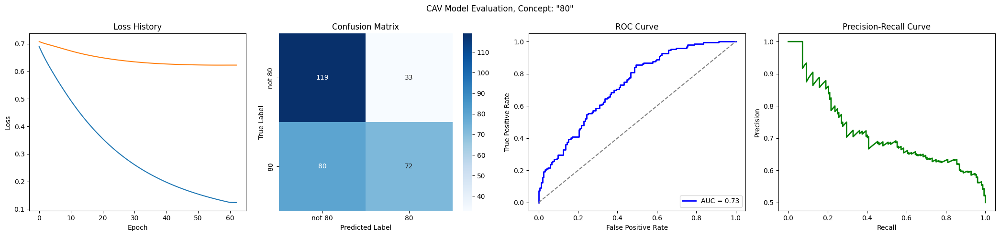

Training run 16/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7185
Epoch 1 Validation Loss: 0.6806
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4879
Epoch 11 Validation Loss: 0.6059
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3325
Epoch 21 Validation Loss: 0.5511
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2316
Epoch 31 Validation Loss: 0.5172
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1677
Epoch 41 Validation Loss: 0.4899
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1271
Epoch 51 Validation Loss: 0.4701
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1004
Epoch 61 Validation Loss: 0.4576
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

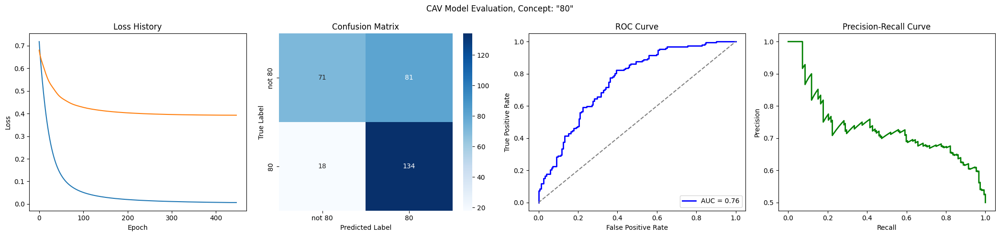

Training run 17/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7043
Epoch 1 Validation Loss: 0.6735
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5099
Epoch 11 Validation Loss: 0.6327
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3764
Epoch 21 Validation Loss: 0.5943
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2843
Epoch 31 Validation Loss: 0.5569
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2197
Epoch 41 Validation Loss: 0.5242
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1739
Epoch 51 Validation Loss: 0.4958
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1412
Epoch 61 Validation Loss: 0.4729
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

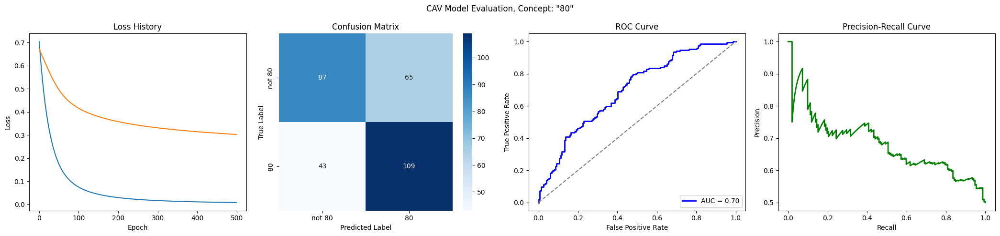

Training run 18/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7026
Epoch 1 Validation Loss: 0.7038
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 8
Loss history saved to trainings/singer_age_decade_80/loss_history.json


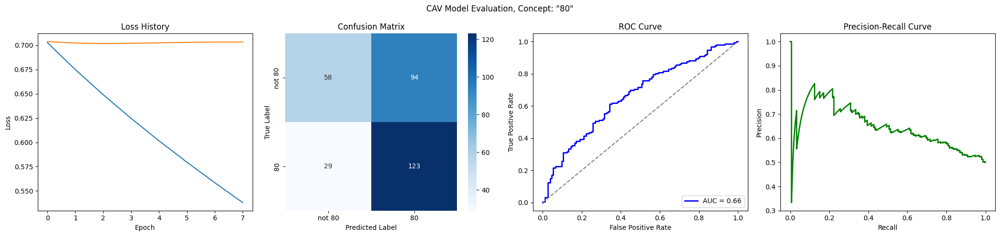

Training run 19/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6868
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4833
Epoch 11 Validation Loss: 0.6648
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3352
Epoch 21 Validation Loss: 0.6430
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2372
Epoch 31 Validation Loss: 0.6242
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1739
Epoch 41 Validation Loss: 0.6088
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1329
Epoch 51 Validation Loss: 0.5970
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1055
Epoch 61 Validation Loss: 0.5875
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

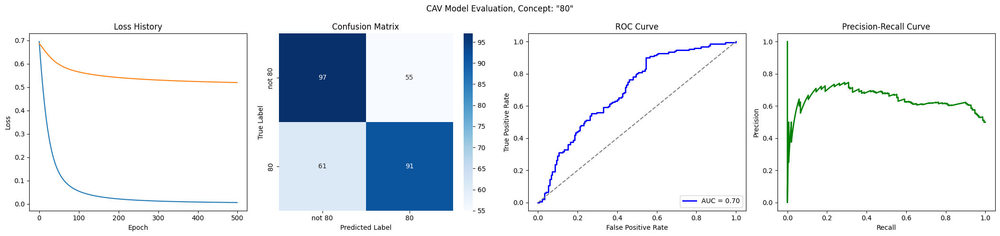

Training run 20/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7159
Epoch 1 Validation Loss: 0.7090
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5234
Epoch 11 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3804
Epoch 21 Validation Loss: 0.6821
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2791
Epoch 31 Validation Loss: 0.6738
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2100
Epoch 41 Validation Loss: 0.6720
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1631
Epoch 51 Validation Loss: 0.6698
Early stopping at epoch 55
Loss history saved to trainings/singer_age_decade_80/loss_history.json


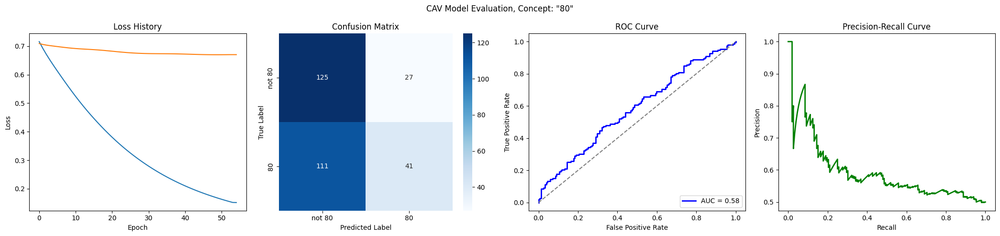

Training run 21/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7027
Epoch 1 Validation Loss: 0.6772
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4833
Epoch 11 Validation Loss: 0.6575
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3297
Epoch 21 Validation Loss: 0.6428
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2298
Epoch 31 Validation Loss: 0.6317
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1667
Epoch 41 Validation Loss: 0.6230
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1266
Epoch 51 Validation Loss: 0.6169
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1001
Epoch 61 Validation Loss: 0.6125
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

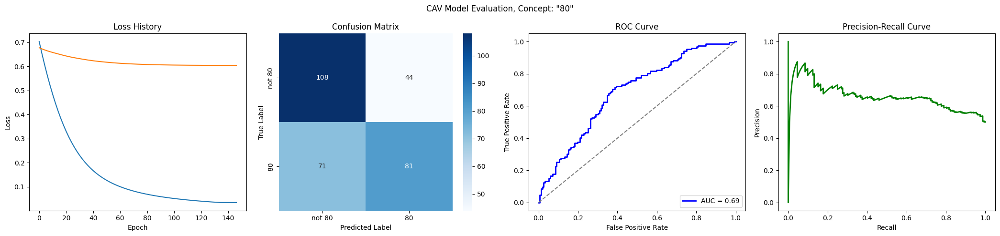

Training run 22/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6992
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5202
Epoch 11 Validation Loss: 0.6410
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3878
Epoch 21 Validation Loss: 0.6052
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2933
Epoch 31 Validation Loss: 0.5829
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2267
Epoch 41 Validation Loss: 0.5696
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1797
Epoch 51 Validation Loss: 0.5618
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1460
Epoch 61 Validation Loss: 0.5573
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

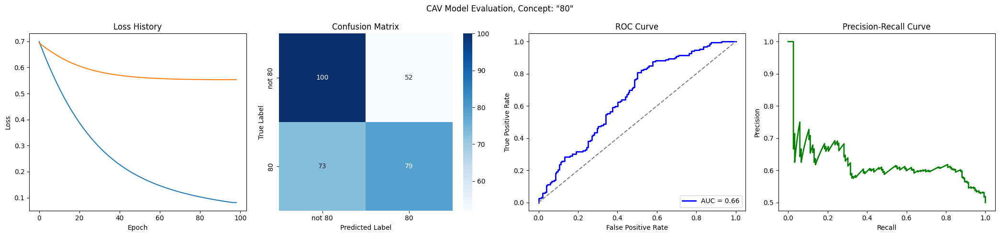

Training run 23/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6836
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4712
Epoch 11 Validation Loss: 0.6442
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3188
Epoch 21 Validation Loss: 0.6097
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2213
Epoch 31 Validation Loss: 0.5808
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1602
Epoch 41 Validation Loss: 0.5580
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1215
Epoch 51 Validation Loss: 0.5397
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0960
Epoch 61 Validation Loss: 0.5253
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

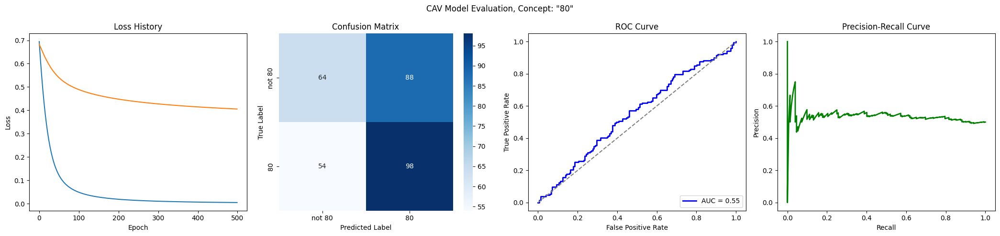

Training run 24/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6857
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5052
Epoch 11 Validation Loss: 0.6458
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3640
Epoch 21 Validation Loss: 0.6172
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2655
Epoch 31 Validation Loss: 0.5990
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1990
Epoch 41 Validation Loss: 0.5882
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1543
Epoch 51 Validation Loss: 0.5824
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1235
Epoch 61 Validation Loss: 0.5797
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

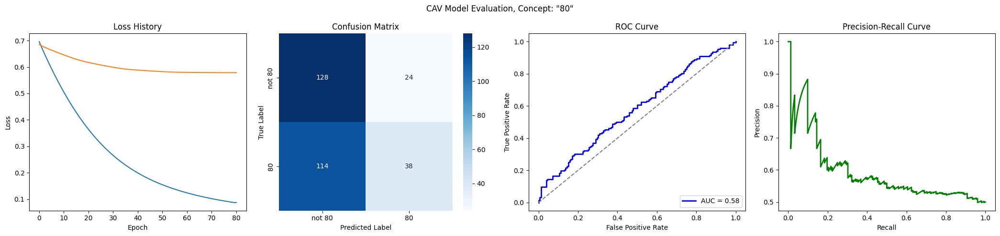

Training run 25/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7137
Epoch 1 Validation Loss: 0.6969
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4692
Epoch 11 Validation Loss: 0.6755
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3294
Epoch 21 Validation Loss: 0.6592
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2435
Epoch 31 Validation Loss: 0.6487
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1862
Epoch 41 Validation Loss: 0.6448
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 50
Loss history saved to trainings/singer_age_decade_80/loss_history.json


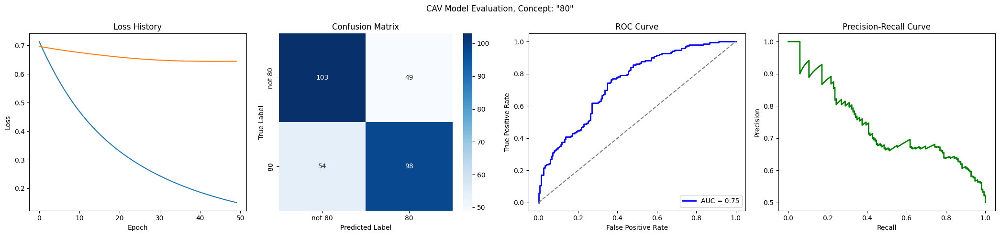

Training run 26/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7014
Epoch 1 Validation Loss: 0.6872
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5268
Epoch 11 Validation Loss: 0.6470
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3947
Epoch 21 Validation Loss: 0.6094
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2986
Epoch 31 Validation Loss: 0.5795
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2304
Epoch 41 Validation Loss: 0.5560
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1822
Epoch 51 Validation Loss: 0.5391
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1478
Epoch 61 Validation Loss: 0.5269
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

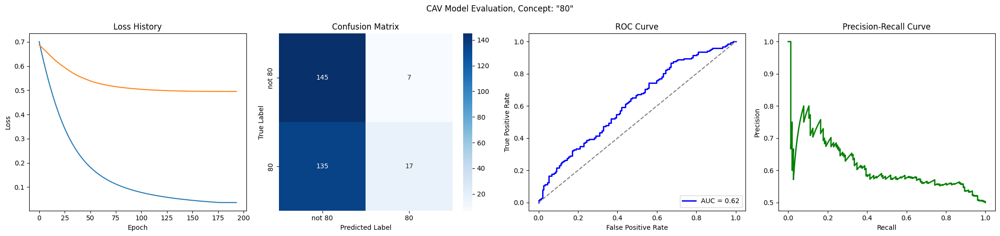

Training run 27/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6829
Epoch 1 Validation Loss: 0.6933
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4683
Epoch 11 Validation Loss: 0.6469
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3188
Epoch 21 Validation Loss: 0.6117
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2221
Epoch 31 Validation Loss: 0.5865
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1612
Epoch 41 Validation Loss: 0.5688
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1224
Epoch 51 Validation Loss: 0.5565
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0969
Epoch 61 Validation Loss: 0.5476
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

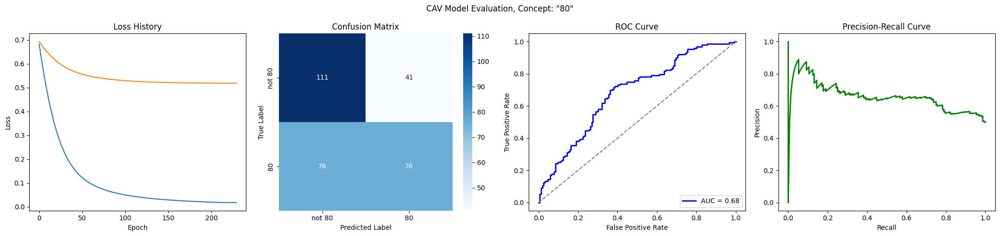

Training run 28/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7038
Epoch 1 Validation Loss: 0.6984
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5006
Epoch 11 Validation Loss: 0.6621
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3528
Epoch 21 Validation Loss: 0.6339
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2525
Epoch 31 Validation Loss: 0.6120
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1867
Epoch 41 Validation Loss: 0.5953
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1434
Epoch 51 Validation Loss: 0.5827
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1141
Epoch 61 Validation Loss: 0.5732
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

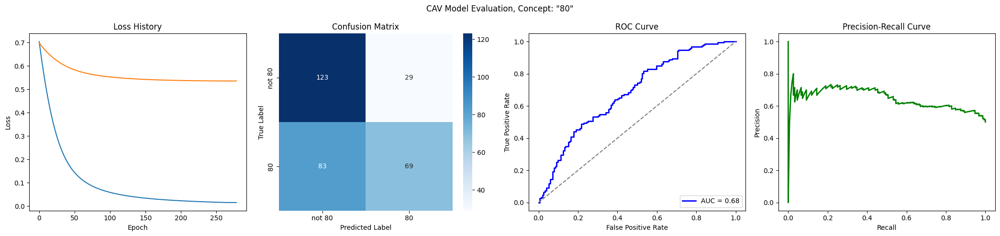

Training run 29/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6929
Epoch 1 Validation Loss: 0.6944
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_80/loss_history.json


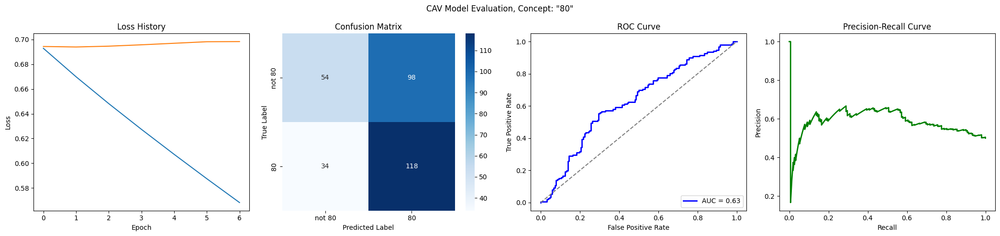

Training run 30/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5136
Epoch 11 Validation Loss: 0.6128
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3815
Epoch 21 Validation Loss: 0.5516
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2878
Epoch 31 Validation Loss: 0.5049
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2222
Epoch 41 Validation Loss: 0.4690
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1760
Epoch 51 Validation Loss: 0.4412
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1430
Epoch 61 Validation Loss: 0.4192
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

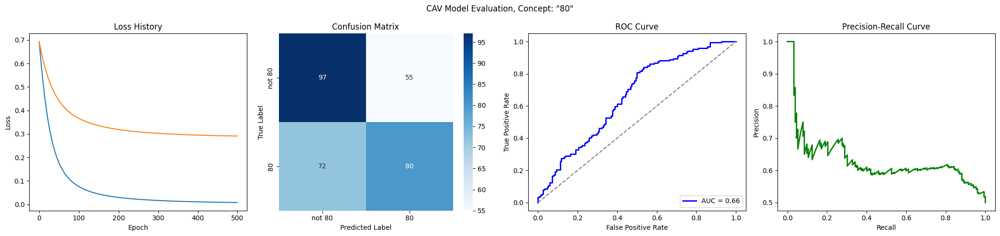

Training run 31/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6807
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4723
Epoch 11 Validation Loss: 0.6709
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3266
Epoch 21 Validation Loss: 0.6484
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2306
Epoch 31 Validation Loss: 0.6289
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1690
Epoch 41 Validation Loss: 0.6130
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1292
Epoch 51 Validation Loss: 0.6004
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1026
Epoch 61 Validation Loss: 0.5905
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

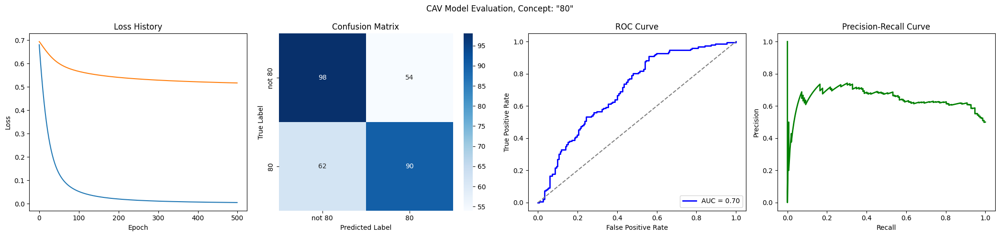

Training run 32/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6783
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4949
Epoch 11 Validation Loss: 0.6310
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3491
Epoch 21 Validation Loss: 0.5964
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2501
Epoch 31 Validation Loss: 0.5719
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1851
Epoch 41 Validation Loss: 0.5552
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1422
Epoch 51 Validation Loss: 0.5448
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1133
Epoch 61 Validation Loss: 0.5381
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

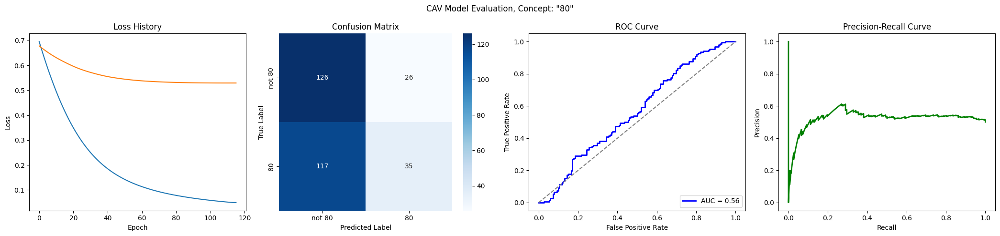

Training run 33/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6856
Epoch 1 Validation Loss: 0.7096
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_80/loss_history.json


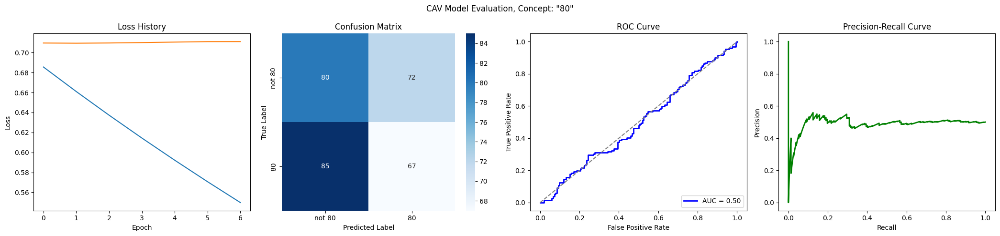

Training run 34/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7305
Epoch 1 Validation Loss: 0.6936
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4779
Epoch 11 Validation Loss: 0.6455
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3347
Epoch 21 Validation Loss: 0.6084
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2477
Epoch 31 Validation Loss: 0.5798
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1899
Epoch 41 Validation Loss: 0.5596
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1499
Epoch 51 Validation Loss: 0.5458
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1215
Epoch 61 Validation Loss: 0.5357
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

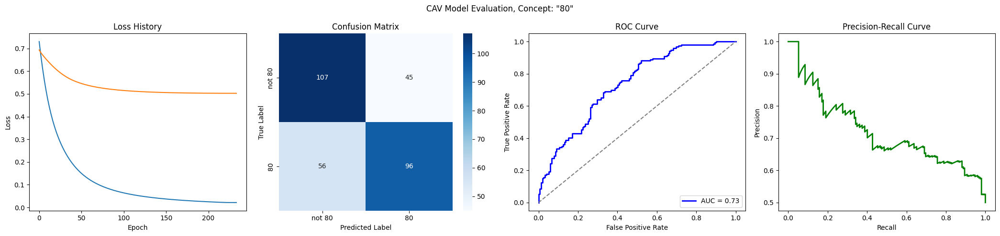

Training run 35/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6897
Epoch 1 Validation Loss: 0.6778
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4761
Epoch 11 Validation Loss: 0.5717
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3306
Epoch 21 Validation Loss: 0.5106
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2343
Epoch 31 Validation Loss: 0.4543
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1722
Epoch 41 Validation Loss: 0.4166
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1317
Epoch 51 Validation Loss: 0.3910
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1046
Epoch 61 Validation Loss: 0.3674
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

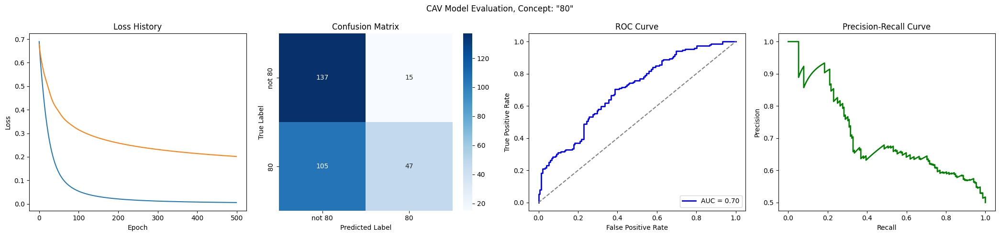

Training run 36/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7046
Epoch 1 Validation Loss: 0.6974
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


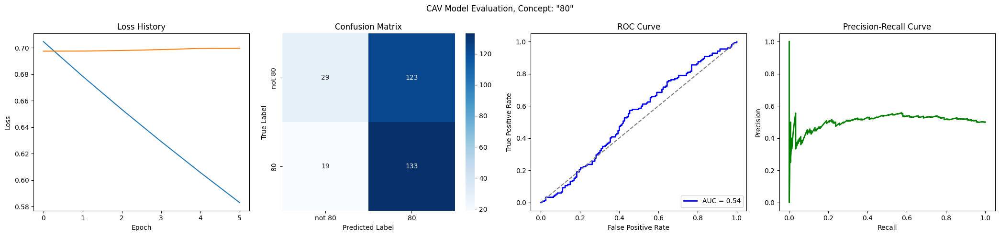

Training run 37/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7174
Epoch 1 Validation Loss: 0.6793
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4973
Epoch 11 Validation Loss: 0.6296
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3450
Epoch 21 Validation Loss: 0.5926
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2439
Epoch 31 Validation Loss: 0.5659
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1787
Epoch 41 Validation Loss: 0.5536
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1364
Epoch 51 Validation Loss: 0.5477
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1081
Epoch 61 Validation Loss: 0.5432
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

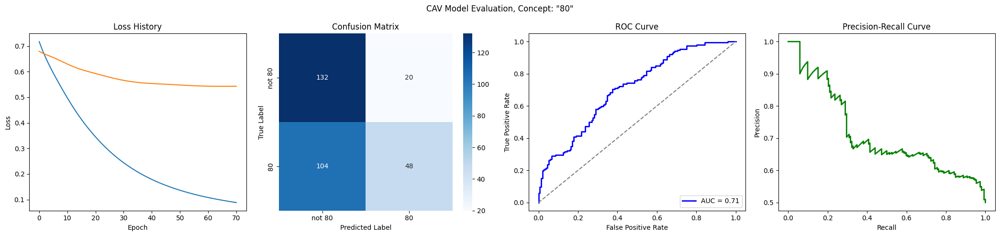

Training run 38/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7090
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4884
Epoch 11 Validation Loss: 0.6618
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3335
Epoch 21 Validation Loss: 0.6375
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2325
Epoch 31 Validation Loss: 0.6204
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1687
Epoch 41 Validation Loss: 0.6082
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1280
Epoch 51 Validation Loss: 0.6003
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1012
Epoch 61 Validation Loss: 0.5946
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

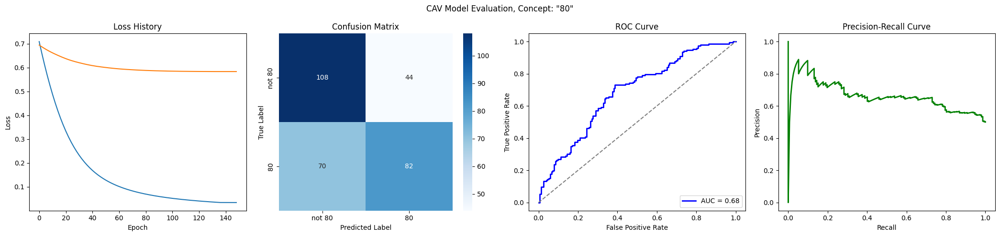

Training run 39/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6868
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5133
Epoch 11 Validation Loss: 0.6359
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3759
Epoch 21 Validation Loss: 0.6063
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2782
Epoch 31 Validation Loss: 0.5809
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2110
Epoch 41 Validation Loss: 0.5706
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1649
Epoch 51 Validation Loss: 0.5626
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1327
Epoch 61 Validation Loss: 0.5611
Early stopping at epoch 63
Loss history saved to trainings/singer_age_decade_80/loss_history.js

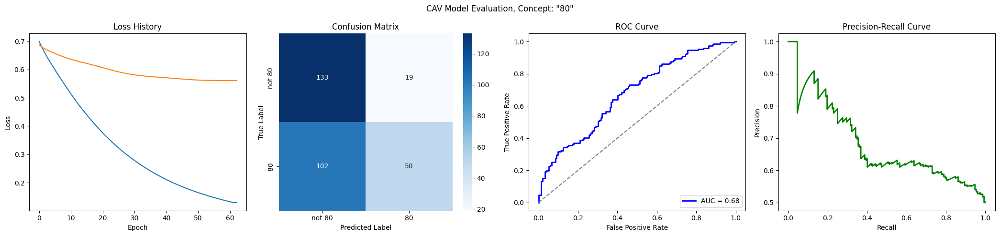

Training run 40/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6951
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4961
Epoch 11 Validation Loss: 0.6279
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3513
Epoch 21 Validation Loss: 0.5730
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2525
Epoch 31 Validation Loss: 0.5285
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1873
Epoch 41 Validation Loss: 0.4933
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1442
Epoch 51 Validation Loss: 0.4658
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1150
Epoch 61 Validation Loss: 0.4439
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

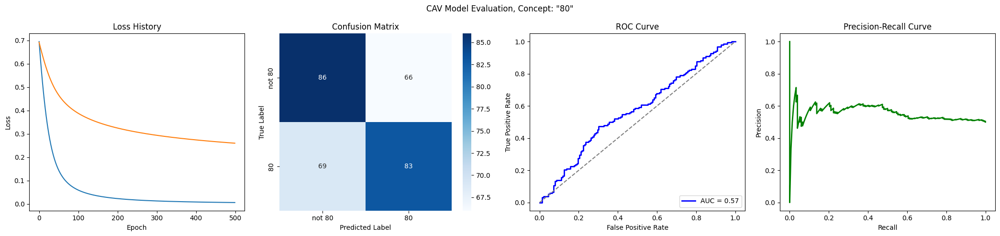

Training run 41/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7041
Epoch 1 Validation Loss: 0.6646
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


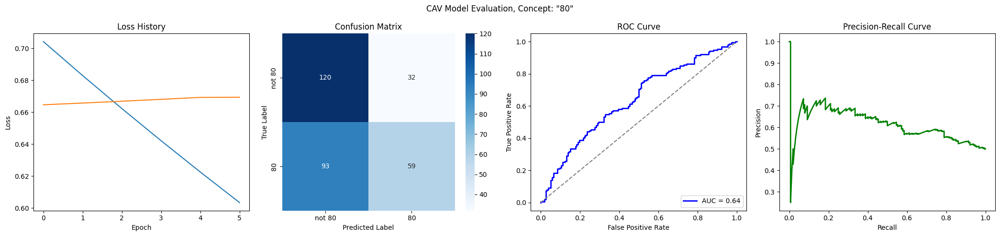

Training run 42/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7078
Epoch 1 Validation Loss: 0.6869
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5276
Epoch 11 Validation Loss: 0.5878
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3922
Epoch 21 Validation Loss: 0.5168
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2949
Epoch 31 Validation Loss: 0.4691
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2265
Epoch 41 Validation Loss: 0.4373
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1785
Epoch 51 Validation Loss: 0.4152
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1445
Epoch 61 Validation Loss: 0.3993
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

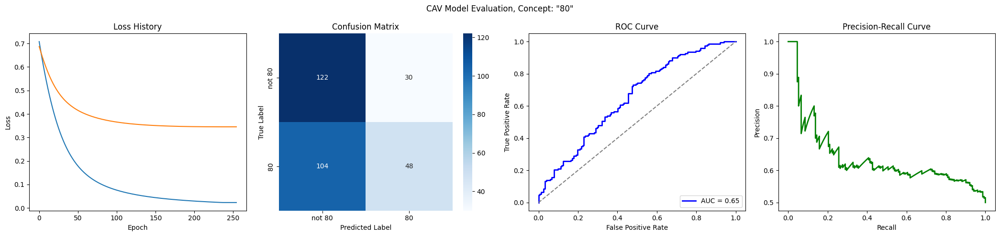

Training run 43/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6943
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5197
Epoch 11 Validation Loss: 0.6195
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3882
Epoch 21 Validation Loss: 0.5678
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2931
Epoch 31 Validation Loss: 0.5311
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2259
Epoch 41 Validation Loss: 0.5046
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1786
Epoch 51 Validation Loss: 0.4851
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1448
Epoch 61 Validation Loss: 0.4696
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

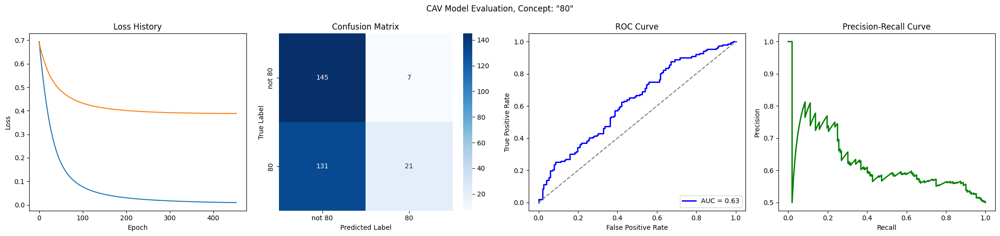

Training run 44/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.7009
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4751
Epoch 11 Validation Loss: 0.5972
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3246
Epoch 21 Validation Loss: 0.5189
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2269
Epoch 31 Validation Loss: 0.4623
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1651
Epoch 41 Validation Loss: 0.4208
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1255
Epoch 51 Validation Loss: 0.3906
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0993
Epoch 61 Validation Loss: 0.3674
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

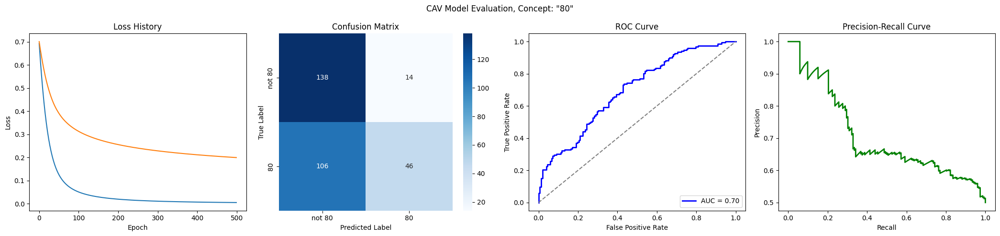

Training run 45/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6995
Epoch 1 Validation Loss: 0.6839
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4815
Epoch 11 Validation Loss: 0.6320
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3299
Epoch 21 Validation Loss: 0.5952
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2311
Epoch 31 Validation Loss: 0.5733
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1684
Epoch 41 Validation Loss: 0.5632
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1281
Epoch 51 Validation Loss: 0.5581
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1014
Epoch 61 Validation Loss: 0.5574
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

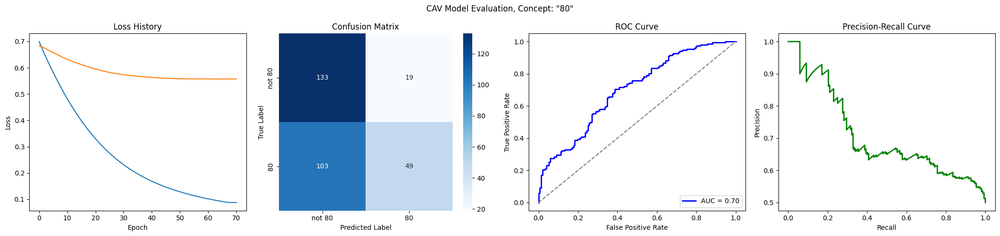

Training run 46/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6679
Epoch 1 Validation Loss: 0.6956
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4743
Epoch 11 Validation Loss: 0.6883
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3342
Epoch 21 Validation Loss: 0.6826
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2394
Epoch 31 Validation Loss: 0.6799
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1772
Epoch 41 Validation Loss: 0.6784
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 47
Loss history saved to trainings/singer_age_decade_80/loss_history.json


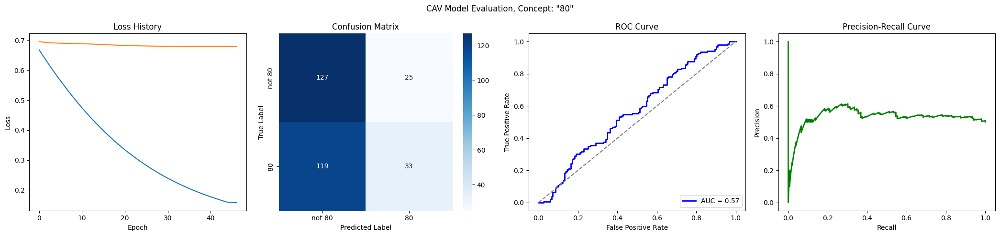

Training run 47/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6995
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


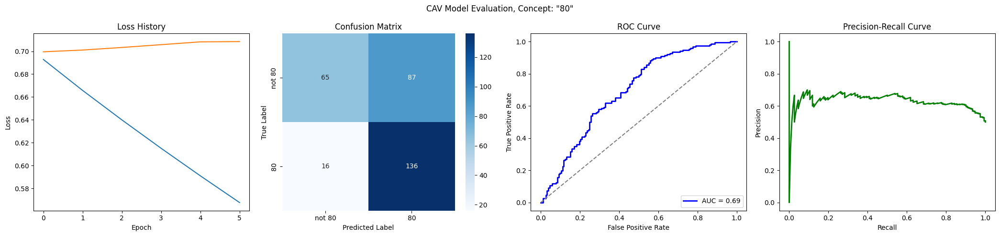

Training run 48/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6899
Epoch 1 Validation Loss: 0.7057
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4732
Epoch 11 Validation Loss: 0.6877
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3231
Epoch 21 Validation Loss: 0.6752
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2259
Epoch 31 Validation Loss: 0.6696
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1644
Epoch 41 Validation Loss: 0.6689
Early stopping at epoch 44
Loss history saved to trainings/singer_age_decade_80/loss_history.json


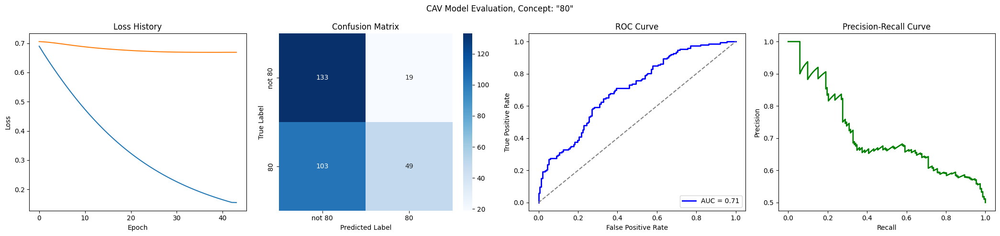

Training run 49/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6955
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


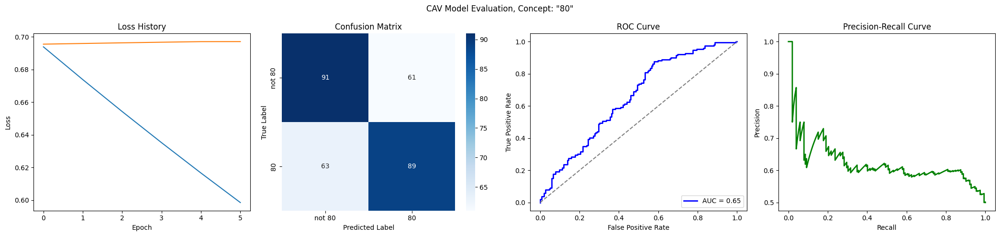

Training run 50/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6835
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


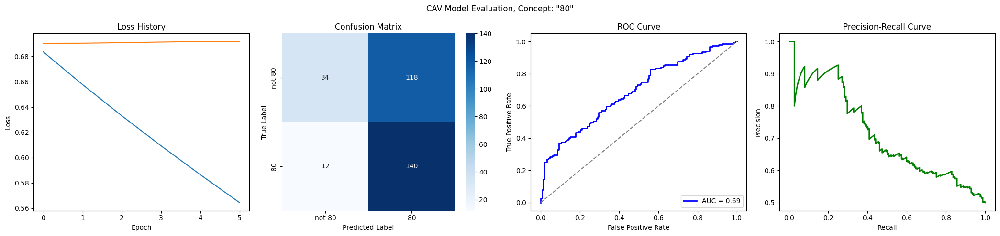

Training run 51/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7010
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_80/loss_history.json


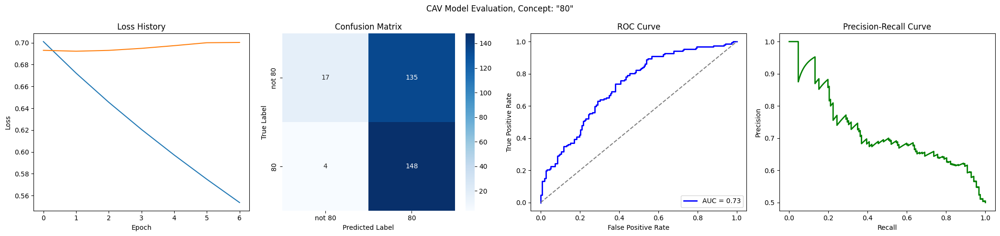

Training run 52/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7192
Epoch 1 Validation Loss: 0.6993
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4817
Epoch 11 Validation Loss: 0.6803
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3193
Epoch 21 Validation Loss: 0.6779
Early stopping at epoch 23
Loss history saved to trainings/singer_age_decade_80/loss_history.json


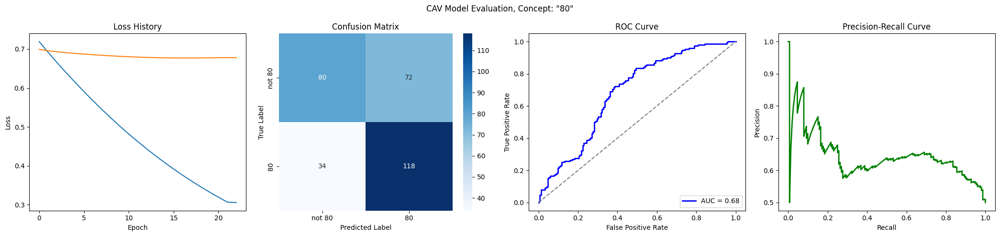

Training run 53/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7057
Epoch 1 Validation Loss: 0.6894
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


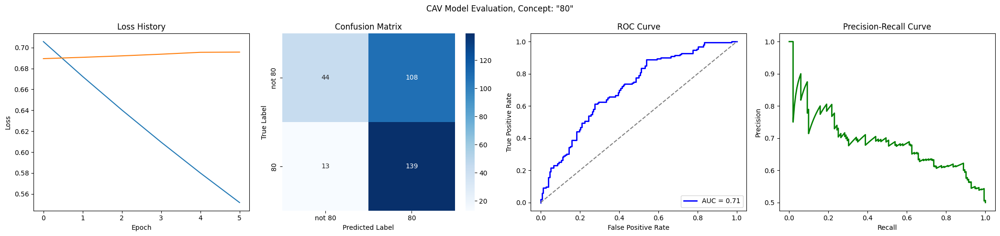

Training run 54/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7023
Epoch 1 Validation Loss: 0.6739
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4731
Epoch 11 Validation Loss: 0.6667
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 20
Loss history saved to trainings/singer_age_decade_80/loss_history.json


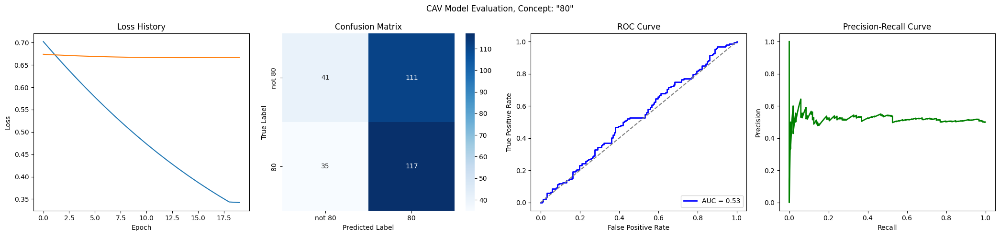

Training run 55/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6901
Epoch 1 Validation Loss: 0.6980
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4686
Epoch 11 Validation Loss: 0.6922
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3175
Epoch 21 Validation Loss: 0.6873
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2206
Epoch 31 Validation Loss: 0.6828
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1598
Epoch 41 Validation Loss: 0.6789
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1213
Epoch 51 Validation Loss: 0.6759
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0959
Epoch 61 Validation Loss: 0.6736
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

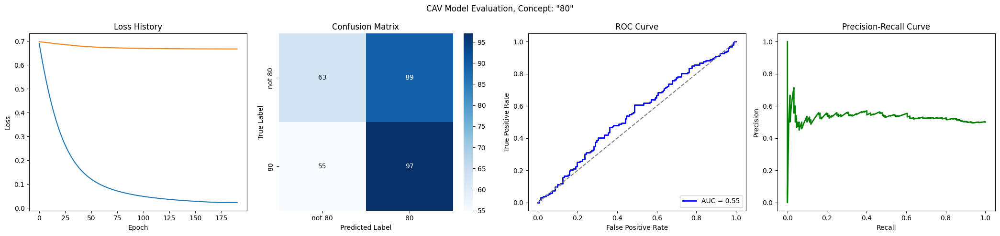

Training run 56/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6836
Epoch 1 Validation Loss: 0.6762
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4881
Epoch 11 Validation Loss: 0.6262
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3461
Epoch 21 Validation Loss: 0.5852
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2492
Epoch 31 Validation Loss: 0.5532
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1850
Epoch 41 Validation Loss: 0.5290
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1426
Epoch 51 Validation Loss: 0.5120
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1138
Epoch 61 Validation Loss: 0.4999
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

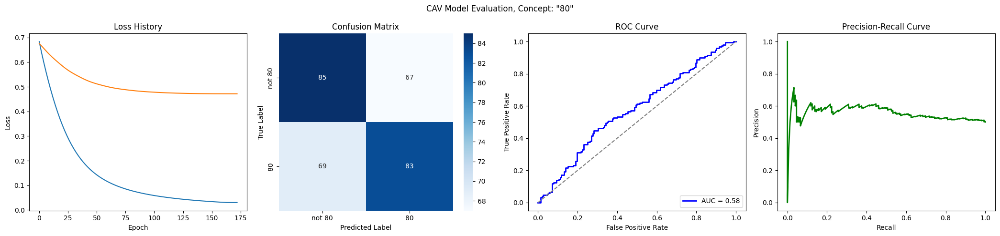

Training run 57/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6836
Epoch 1 Validation Loss: 0.6874
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5088
Epoch 11 Validation Loss: 0.6161
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3796
Epoch 21 Validation Loss: 0.5583
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2872
Epoch 31 Validation Loss: 0.5135
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2221
Epoch 41 Validation Loss: 0.4785
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1760
Epoch 51 Validation Loss: 0.4511
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1430
Epoch 61 Validation Loss: 0.4292
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

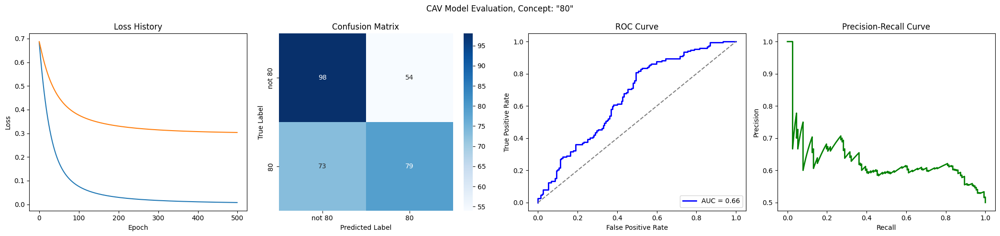

Training run 58/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6881
Epoch 1 Validation Loss: 0.6847
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


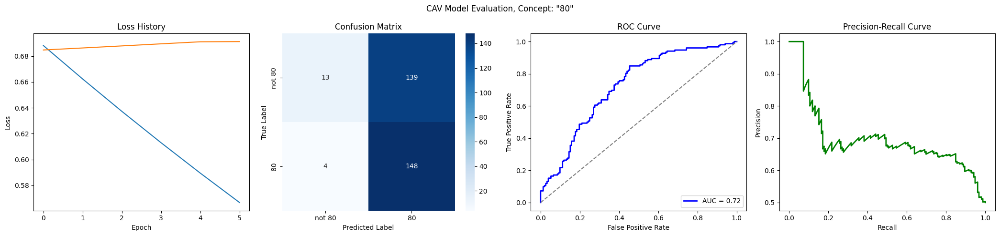

Training run 59/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6748
Epoch 1 Validation Loss: 0.6733
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4032
Epoch 11 Validation Loss: 0.6384
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.2470
Epoch 21 Validation Loss: 0.6075
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.1598
Epoch 31 Validation Loss: 0.5821
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1106
Epoch 41 Validation Loss: 0.5630
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.0819
Epoch 51 Validation Loss: 0.5487
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0640
Epoch 61 Validation Loss: 0.5377
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

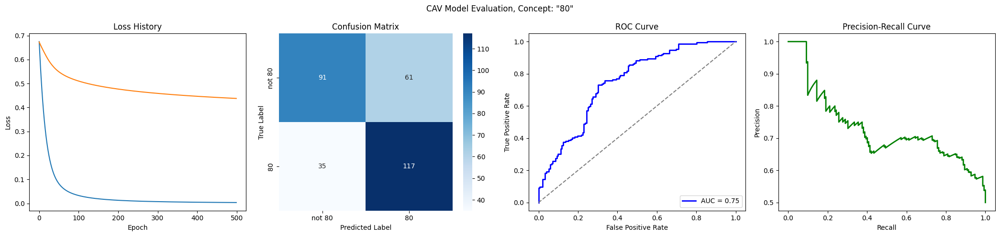

Training run 60/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6956
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4746
Epoch 11 Validation Loss: 0.6631
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3217
Epoch 21 Validation Loss: 0.6427
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2234
Epoch 31 Validation Loss: 0.6307
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1617
Epoch 41 Validation Loss: 0.6237
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1226
Epoch 51 Validation Loss: 0.6199
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0969
Epoch 61 Validation Loss: 0.6182
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

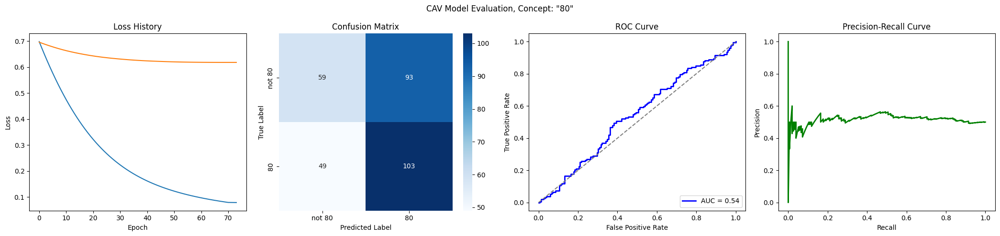

Training run 61/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.7071
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4861
Epoch 11 Validation Loss: 0.6703
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3386
Epoch 21 Validation Loss: 0.6326
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2401
Epoch 31 Validation Loss: 0.6022
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1763
Epoch 41 Validation Loss: 0.5745
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1348
Epoch 51 Validation Loss: 0.5551
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1070
Epoch 61 Validation Loss: 0.5384
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

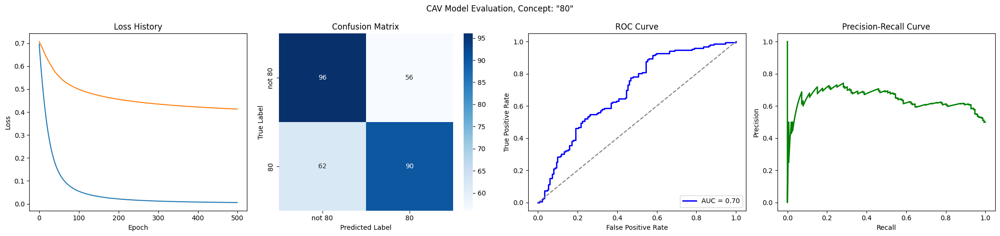

Training run 62/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7265
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4909
Epoch 11 Validation Loss: 0.6640
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3301
Epoch 21 Validation Loss: 0.6375
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2274
Epoch 31 Validation Loss: 0.6148
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1635
Epoch 41 Validation Loss: 0.5967
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1234
Epoch 51 Validation Loss: 0.5828
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0972
Epoch 61 Validation Loss: 0.5718
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

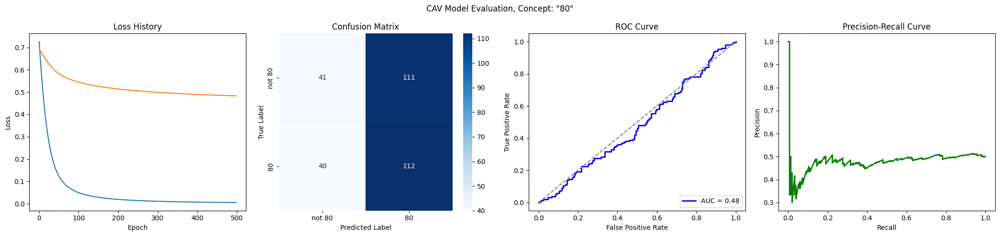

Training run 63/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6823
Epoch 1 Validation Loss: 0.6846
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 7
Loss history saved to trainings/singer_age_decade_80/loss_history.json


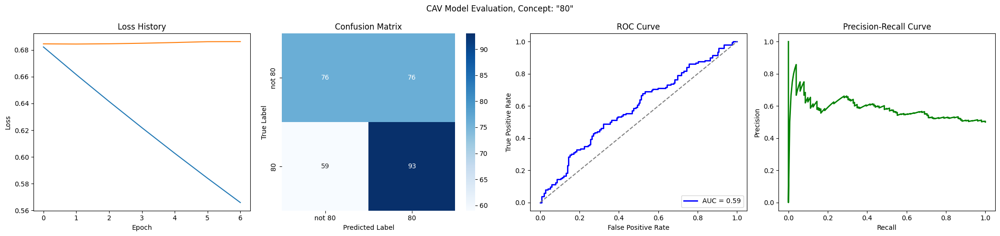

Training run 64/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7123
Epoch 1 Validation Loss: 0.7305
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4286
Epoch 11 Validation Loss: 0.6920
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.2657
Epoch 21 Validation Loss: 0.6614
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.1734
Epoch 31 Validation Loss: 0.6463
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1204
Epoch 41 Validation Loss: 0.6342
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.0892
Epoch 51 Validation Loss: 0.6261
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0696
Epoch 61 Validation Loss: 0.6217
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

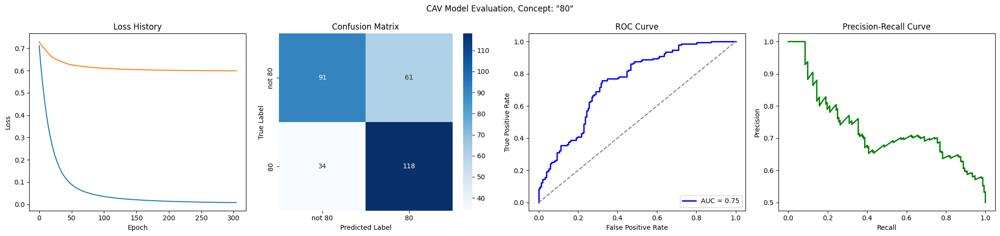

Training run 65/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7047
Epoch 1 Validation Loss: 0.7015
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5088
Epoch 11 Validation Loss: 0.6604
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3752
Epoch 21 Validation Loss: 0.6232
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2835
Epoch 31 Validation Loss: 0.5865
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2193
Epoch 41 Validation Loss: 0.5539
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1738
Epoch 51 Validation Loss: 0.5253
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1411
Epoch 61 Validation Loss: 0.5021
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

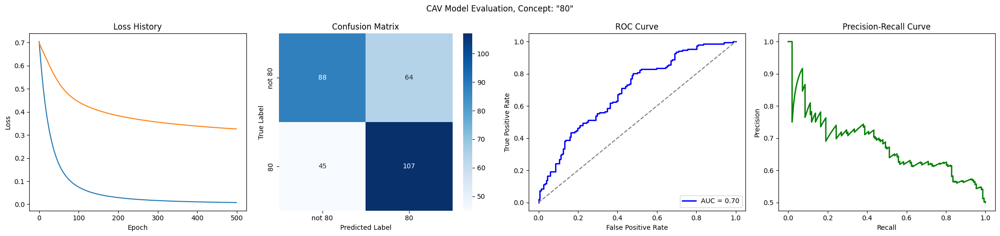

Training run 66/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6829
Epoch 1 Validation Loss: 0.6889
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4348
Epoch 11 Validation Loss: 0.6402
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.2922
Epoch 21 Validation Loss: 0.6135
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2056
Epoch 31 Validation Loss: 0.6034
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1507
Epoch 41 Validation Loss: 0.6026
Early stopping at epoch 42
Loss history saved to trainings/singer_age_decade_80/loss_history.json


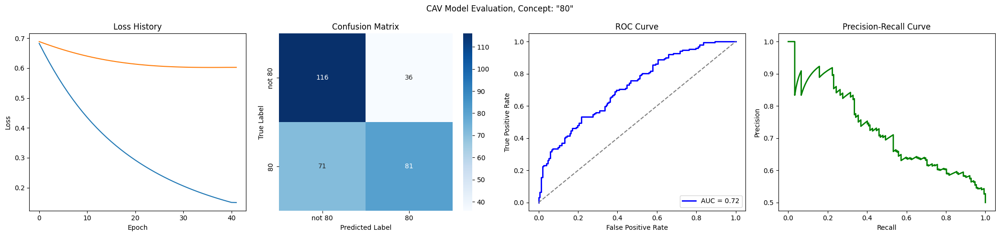

Training run 67/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6807
Epoch 1 Validation Loss: 0.6801
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4362
Epoch 11 Validation Loss: 0.6523
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.2852
Epoch 21 Validation Loss: 0.6313
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.1940
Epoch 31 Validation Loss: 0.6157
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1388
Epoch 41 Validation Loss: 0.6041
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1045
Epoch 51 Validation Loss: 0.5952
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0823
Epoch 61 Validation Loss: 0.5881
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

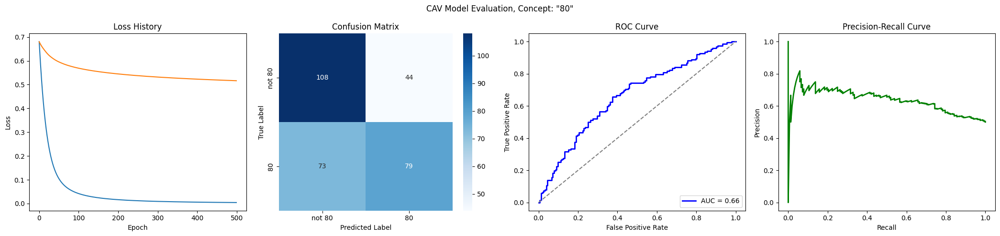

Training run 68/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.7163
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5209
Epoch 11 Validation Loss: 0.6519
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3923
Epoch 21 Validation Loss: 0.6093
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2981
Epoch 31 Validation Loss: 0.5769
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2309
Epoch 41 Validation Loss: 0.5557
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1830
Epoch 51 Validation Loss: 0.5400
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1487
Epoch 61 Validation Loss: 0.5287
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

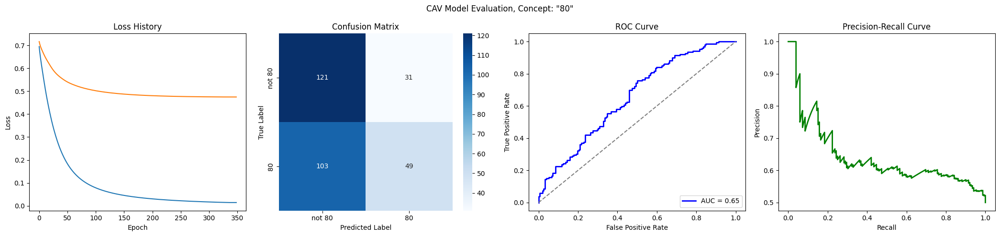

Training run 69/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6895
Epoch 1 Validation Loss: 0.6791
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4703
Epoch 11 Validation Loss: 0.6596
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3247
Epoch 21 Validation Loss: 0.6419
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2309
Epoch 31 Validation Loss: 0.6268
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1703
Epoch 41 Validation Loss: 0.6150
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1307
Epoch 51 Validation Loss: 0.6061
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1040
Epoch 61 Validation Loss: 0.5994
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

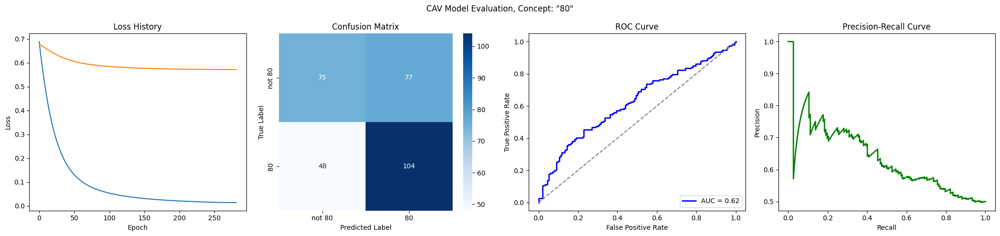

Training run 70/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6900
Epoch 1 Validation Loss: 0.6972
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5131
Epoch 11 Validation Loss: 0.6204
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3809
Epoch 21 Validation Loss: 0.5598
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2862
Epoch 31 Validation Loss: 0.5140
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2198
Epoch 41 Validation Loss: 0.4793
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1733
Epoch 51 Validation Loss: 0.4522
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1403
Epoch 61 Validation Loss: 0.4304
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

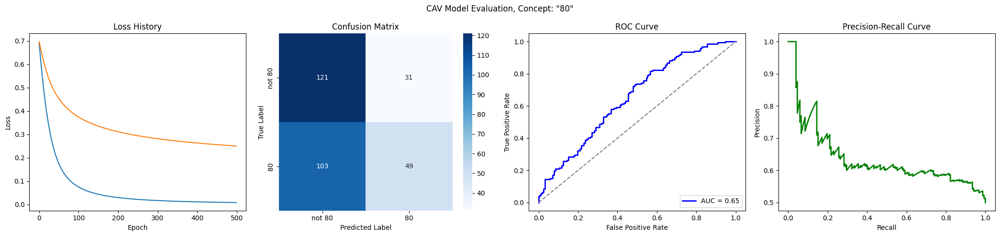

Training run 71/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6850
Epoch 1 Validation Loss: 0.6968
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4869
Epoch 11 Validation Loss: 0.6784
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3433
Epoch 21 Validation Loss: 0.6603
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2459
Epoch 31 Validation Loss: 0.6435
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1820
Epoch 41 Validation Loss: 0.6299
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1400
Epoch 51 Validation Loss: 0.6191
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1115
Epoch 61 Validation Loss: 0.6110
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

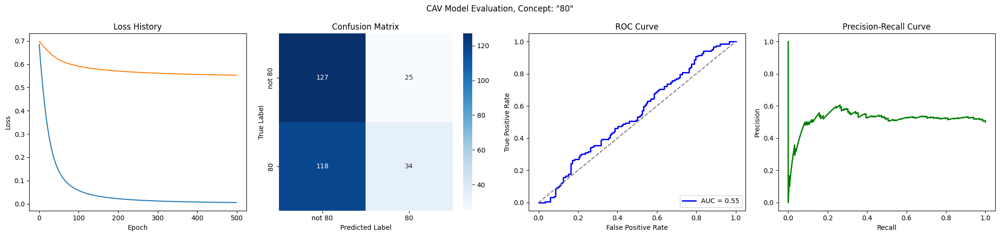

Training run 72/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6915
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4700
Epoch 11 Validation Loss: 0.6686
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3180
Epoch 21 Validation Loss: 0.6446
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2207
Epoch 31 Validation Loss: 0.6215
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1598
Epoch 41 Validation Loss: 0.6016
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1212
Epoch 51 Validation Loss: 0.5858
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0958
Epoch 61 Validation Loss: 0.5736
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

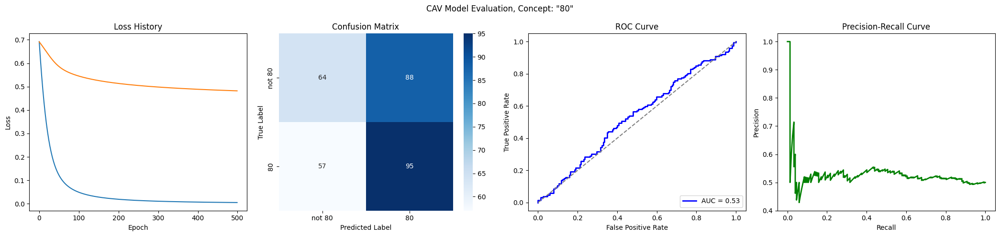

Training run 73/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6752
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


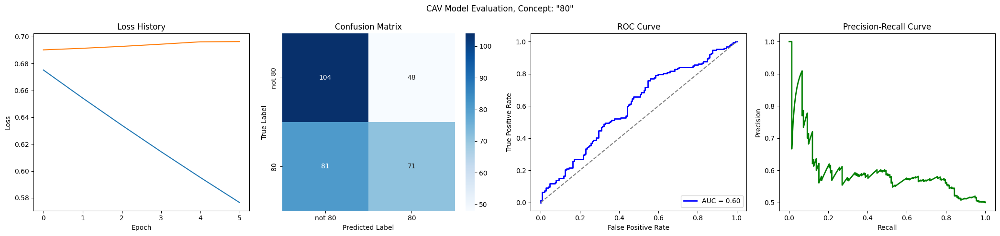

Training run 74/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6806
Epoch 1 Validation Loss: 0.6992
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4623
Epoch 11 Validation Loss: 0.6501
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3133
Epoch 21 Validation Loss: 0.6112
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2177
Epoch 31 Validation Loss: 0.5828
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1578
Epoch 41 Validation Loss: 0.5604
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1197
Epoch 51 Validation Loss: 0.5453
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0947
Epoch 61 Validation Loss: 0.5339
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

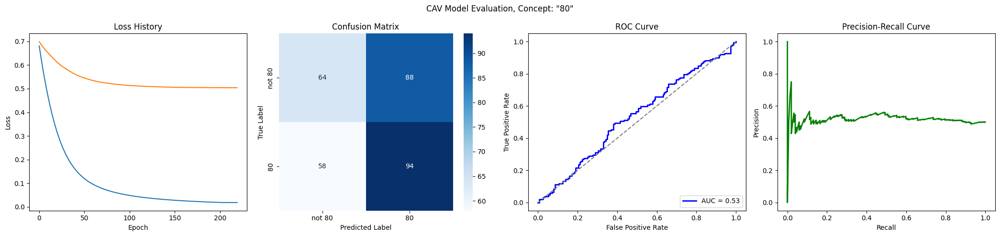

Training run 75/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7070
Epoch 1 Validation Loss: 0.6977
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


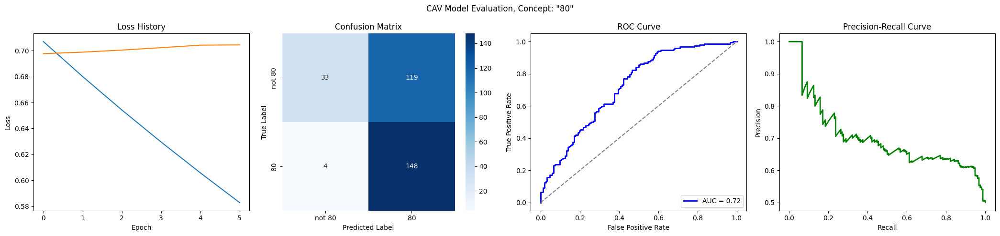

Training run 76/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6990
Epoch 1 Validation Loss: 0.6772
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5183
Epoch 11 Validation Loss: 0.6317
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3858
Epoch 21 Validation Loss: 0.5918
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2914
Epoch 31 Validation Loss: 0.5568
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2250
Epoch 41 Validation Loss: 0.5251
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1780
Epoch 51 Validation Loss: 0.4975
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1444
Epoch 61 Validation Loss: 0.4736
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

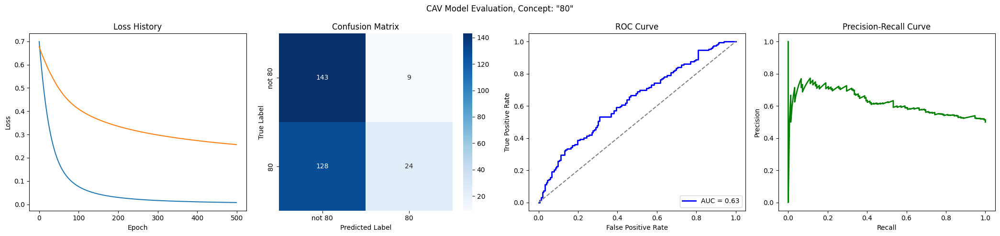

Training run 77/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7024
Epoch 1 Validation Loss: 0.6811
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4859
Epoch 11 Validation Loss: 0.5804
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3359
Epoch 21 Validation Loss: 0.5143
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2368
Epoch 31 Validation Loss: 0.4572
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1732
Epoch 41 Validation Loss: 0.4211
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1321
Epoch 51 Validation Loss: 0.3918
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1047
Epoch 61 Validation Loss: 0.3689
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

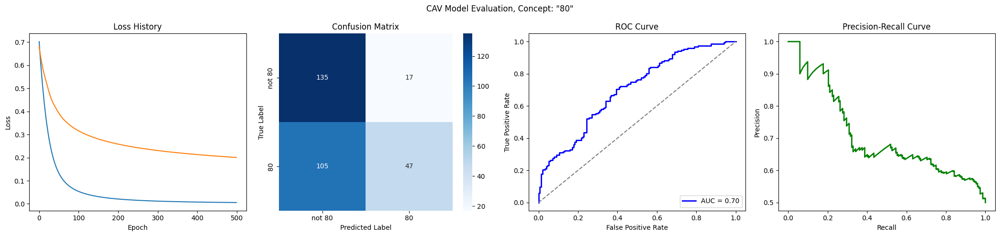

Training run 78/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7146
Epoch 1 Validation Loss: 0.6797
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5155
Epoch 11 Validation Loss: 0.6447
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3812
Epoch 21 Validation Loss: 0.6201
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2890
Epoch 31 Validation Loss: 0.5945
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2243
Epoch 41 Validation Loss: 0.5779
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1782
Epoch 51 Validation Loss: 0.5629
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1450
Epoch 61 Validation Loss: 0.5531
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

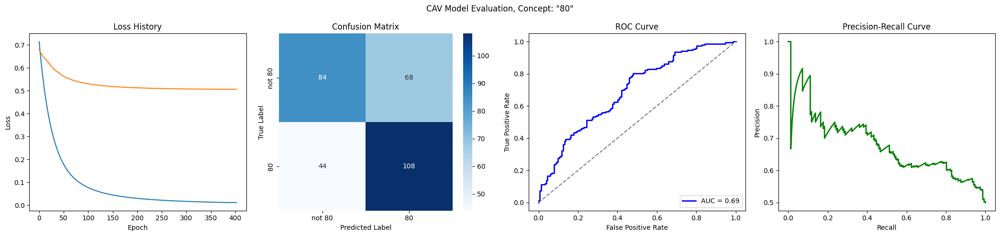

Training run 79/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6945
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 8
Loss history saved to trainings/singer_age_decade_80/loss_history.json


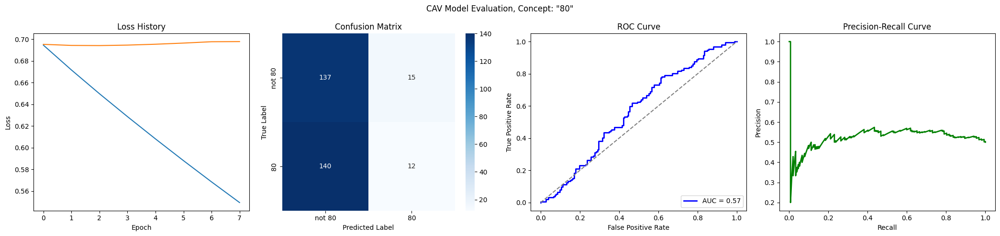

Training run 80/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7109
Epoch 1 Validation Loss: 0.7162
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4575
Epoch 11 Validation Loss: 0.6287
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3023
Epoch 21 Validation Loss: 0.5685
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2075
Epoch 31 Validation Loss: 0.5283
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1490
Epoch 41 Validation Loss: 0.4976
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1124
Epoch 51 Validation Loss: 0.4773
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0885
Epoch 61 Validation Loss: 0.4634
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

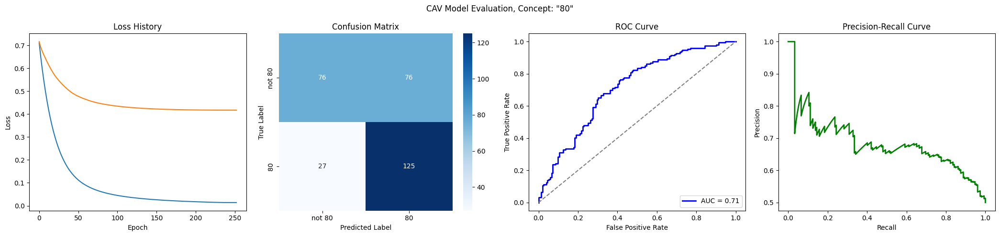

Training run 81/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7160
Epoch 1 Validation Loss: 0.6984
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


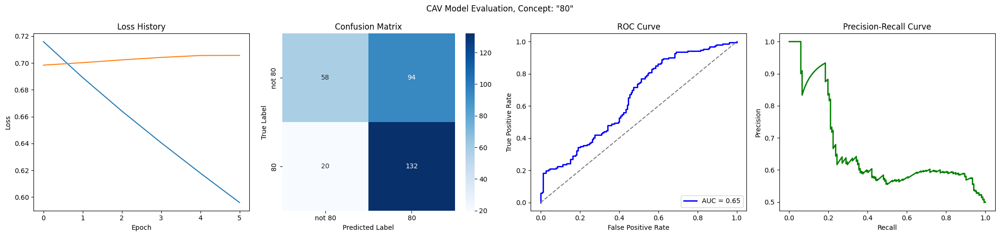

Training run 82/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7169
Epoch 1 Validation Loss: 0.6893
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4699
Epoch 11 Validation Loss: 0.6771
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3112
Epoch 21 Validation Loss: 0.6754
Early stopping at epoch 23
Loss history saved to trainings/singer_age_decade_80/loss_history.json


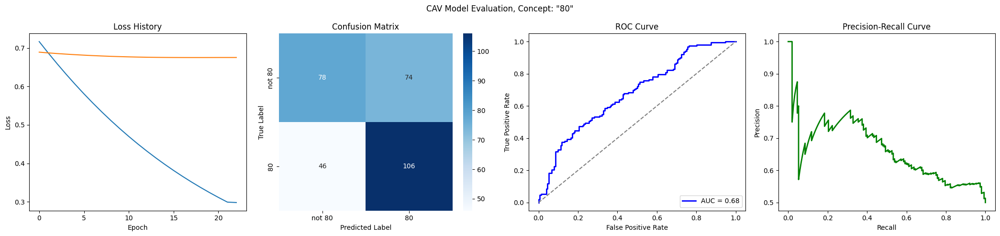

Training run 83/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7134
Epoch 1 Validation Loss: 0.7003
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5132
Epoch 11 Validation Loss: 0.6314
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3695
Epoch 21 Validation Loss: 0.5787
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2689
Epoch 31 Validation Loss: 0.5336
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2011
Epoch 41 Validation Loss: 0.4984
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1555
Epoch 51 Validation Loss: 0.4703
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1243
Epoch 61 Validation Loss: 0.4477
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

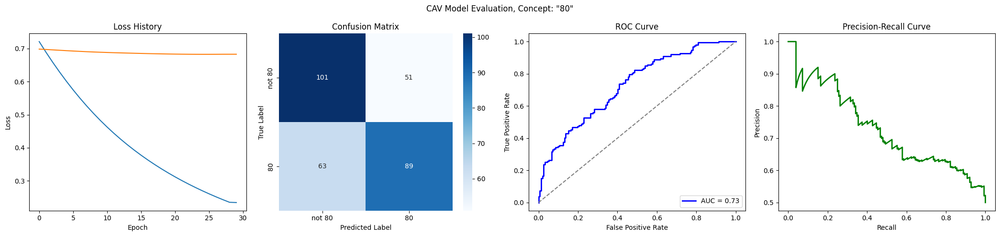

Training run 90/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7034
Epoch 1 Validation Loss: 0.6819
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


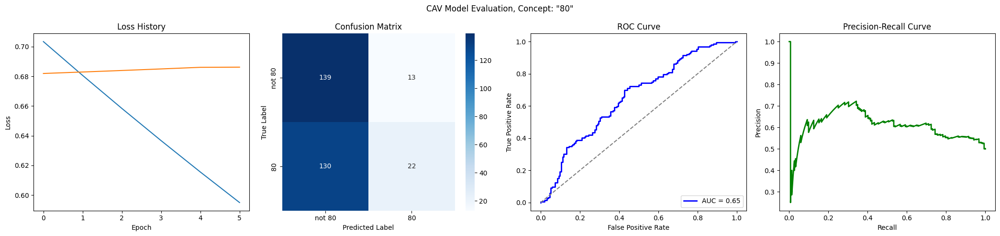

Training run 91/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7022
Epoch 1 Validation Loss: 0.6879
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5081
Epoch 11 Validation Loss: 0.6161
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3754
Epoch 21 Validation Loss: 0.5496
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2839
Epoch 31 Validation Loss: 0.4898
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.2196
Epoch 41 Validation Loss: 0.4396
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1740
Epoch 51 Validation Loss: 0.3990
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1413
Epoch 61 Validation Loss: 0.3670
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

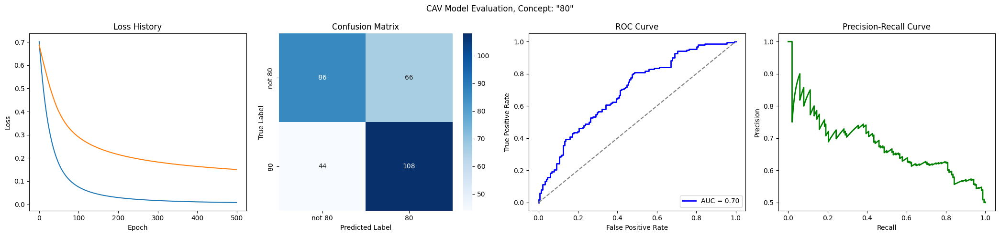

Training run 92/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6728
Epoch 1 Validation Loss: 0.6931
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4334
Epoch 11 Validation Loss: 0.6173
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.2852
Epoch 21 Validation Loss: 0.5601
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.1946
Epoch 31 Validation Loss: 0.5181
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1392
Epoch 41 Validation Loss: 0.4889
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1048
Epoch 51 Validation Loss: 0.4686
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0825
Epoch 61 Validation Loss: 0.4542
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

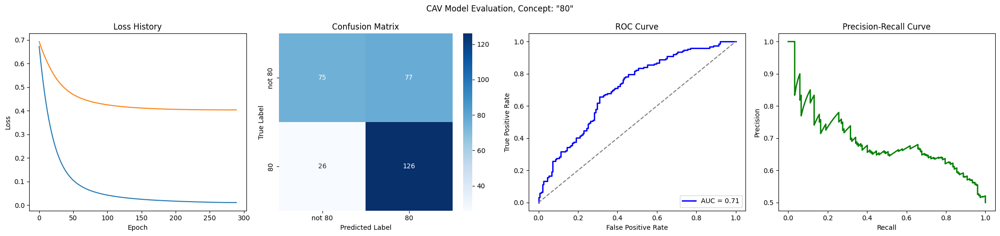

Training run 93/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6935
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4782
Epoch 11 Validation Loss: 0.6471
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3260
Epoch 21 Validation Loss: 0.6113
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2271
Epoch 31 Validation Loss: 0.5852
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1648
Epoch 41 Validation Loss: 0.5667
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1251
Epoch 51 Validation Loss: 0.5536
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0989
Epoch 61 Validation Loss: 0.5441
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

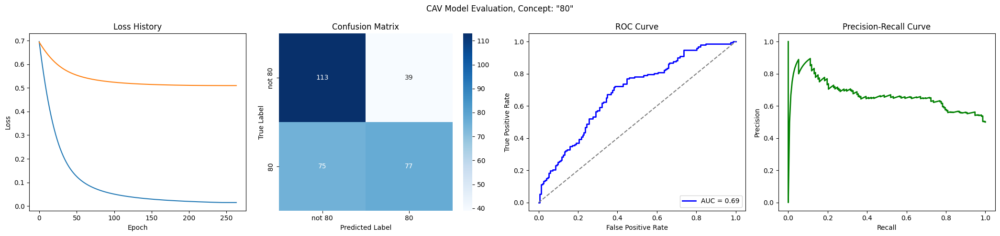

Training run 94/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6823
Epoch 1 Validation Loss: 0.6775
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 6
Loss history saved to trainings/singer_age_decade_80/loss_history.json


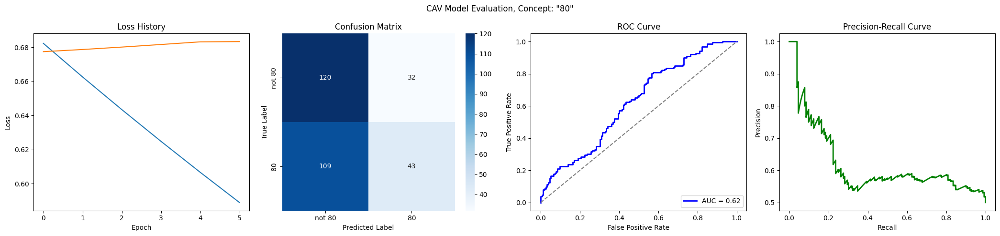

Training run 95/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6784
Epoch 1 Validation Loss: 0.6606
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4906
Epoch 11 Validation Loss: 0.6064
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3520
Epoch 21 Validation Loss: 0.5650
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2561
Epoch 31 Validation Loss: 0.5355
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1918
Epoch 41 Validation Loss: 0.5154
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1487
Epoch 51 Validation Loss: 0.5019
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1191
Epoch 61 Validation Loss: 0.4928
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

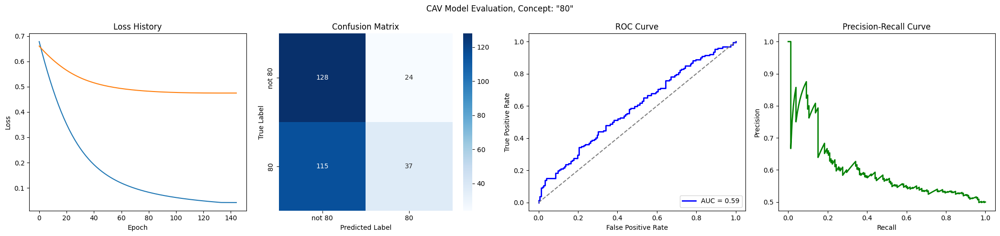

Training run 96/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6860
Epoch 1 Validation Loss: 0.6878
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4463
Epoch 11 Validation Loss: 0.6548
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.2943
Epoch 21 Validation Loss: 0.6401
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2006
Epoch 31 Validation Loss: 0.6342
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1434
Epoch 41 Validation Loss: 0.6330
Model saved to trainings/singer_age_decade_80/state_dict.pth
Early stopping at epoch 46
Loss history saved to trainings/singer_age_decade_80/loss_history.json


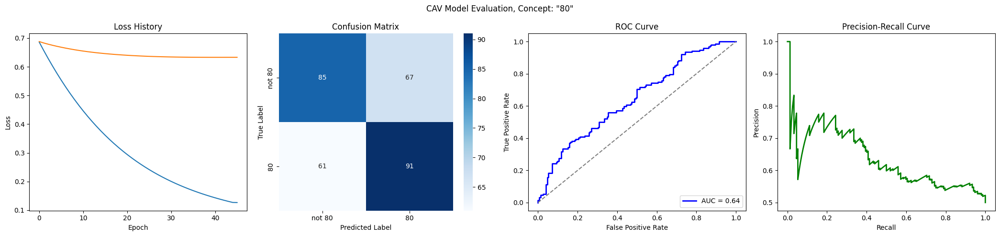

Training run 97/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6849
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4707
Epoch 11 Validation Loss: 0.6309
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3185
Epoch 21 Validation Loss: 0.5895
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2210
Epoch 31 Validation Loss: 0.5578
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1600
Epoch 41 Validation Loss: 0.5347
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1213
Epoch 51 Validation Loss: 0.5181
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0959
Epoch 61 Validation Loss: 0.5066
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

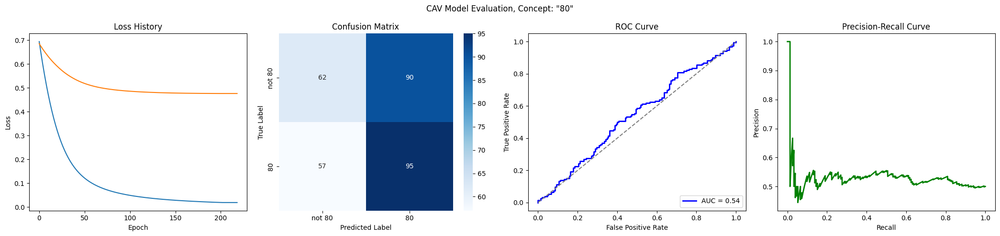

Training run 98/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.6861
Epoch 1 Validation Loss: 0.6995
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4479
Epoch 11 Validation Loss: 0.6769
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.2961
Epoch 21 Validation Loss: 0.6640
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2020
Epoch 31 Validation Loss: 0.6556
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1444
Epoch 41 Validation Loss: 0.6507
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1087
Epoch 51 Validation Loss: 0.6477
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.0856
Epoch 61 Validation Loss: 0.6454
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

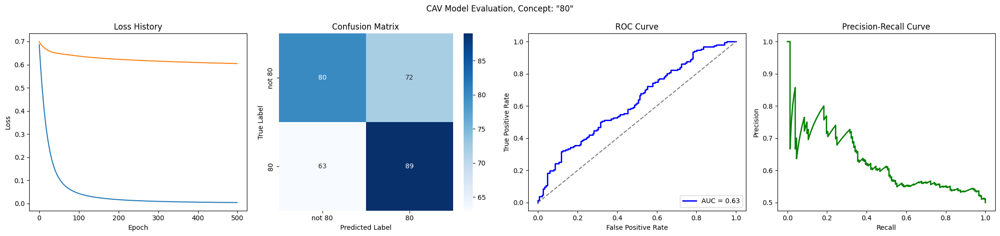

Training run 99/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7109
Epoch 1 Validation Loss: 0.6897
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5072
Epoch 11 Validation Loss: 0.6619
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3593
Epoch 21 Validation Loss: 0.6385
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2580
Epoch 31 Validation Loss: 0.6186
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1911
Epoch 41 Validation Loss: 0.6038
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1469
Epoch 51 Validation Loss: 0.5913
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1170
Epoch 61 Validation Loss: 0.5818
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 

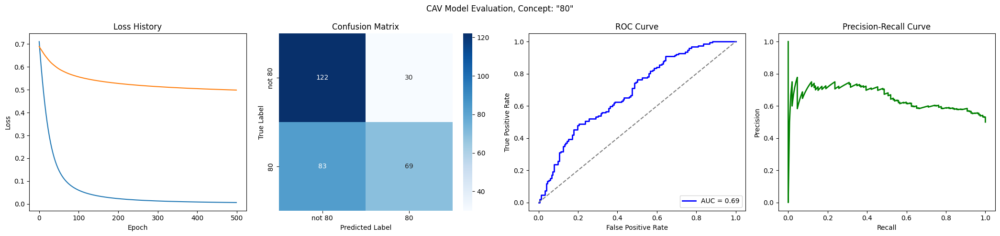

Training run 100/100
5 5
Epoch 1/500
Epoch 1 Train Loss: 0.7026
Epoch 1 Validation Loss: 0.6782
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.4903
Epoch 11 Validation Loss: 0.6454
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3427
Epoch 21 Validation Loss: 0.6208
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.2438
Epoch 31 Validation Loss: 0.5952
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.1794
Epoch 41 Validation Loss: 0.5746
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.1374
Epoch 51 Validation Loss: 0.5570
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.1091
Epoch 61 Validation Loss: 0.5432
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss:

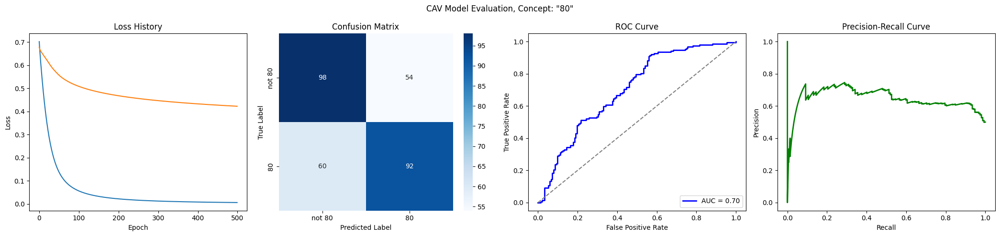

CPU times: user 4min 29s, sys: 20min 47s, total: 25min 16s
Wall time: 1h 49min 12s


In [ ]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [ ]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [ ]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [ ]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [ ]:
validation_sample_count

2

In [ ]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


14 2
Epoch 1/500
Epoch 1 Train Loss: 0.7022
Epoch 1 Validation Loss: 0.6745
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.5620
Epoch 11 Validation Loss: 0.6651
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.4557
Epoch 21 Validation Loss: 0.6577
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.3743
Epoch 31 Validation Loss: 0.6520
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.3117
Epoch 41 Validation Loss: 0.6484
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.2630
Epoch 51 Validation Loss: 0.6465
Model saved to trainings/singer_age_decade_80/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.2247
Epoch 61 Validation Loss: 0.6461
Early stopping at epoch 61
Loss history saved to trainings/singer_age_decade_80/loss_history.json


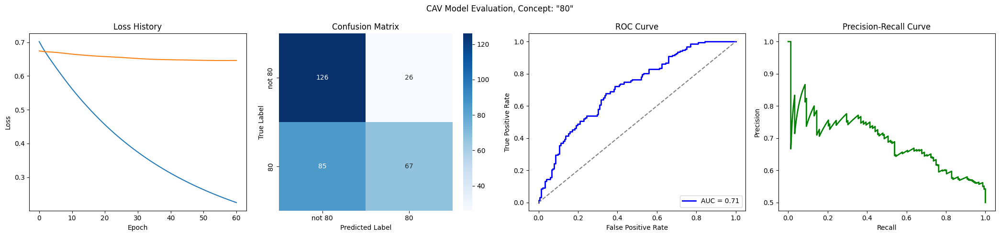

In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
